In [1]:
import cupy as xp
import numpy as np

Test if D^(-1)H is a projection 

D = diag(SS'R|w|^2)

H = diag(Rw)SS'diag(Rw') = QQ'

In [2]:
from Operators import Replicate_frame, Illuminate_frames
from Operators import Split_Overlap_plan
import h5py
import matplotlib.pyplot as plt

In [3]:
fid = h5py.File("poster_32x32.h5", "r")
illumination = xp.array(fid["probe"], dtype=xp.complex64)
data = xp.array(fid["data"], dtype=xp.float32)
translations_x = xp.array(fid["translations_x"]) #load the real and imag of dtype int64
translations_y = xp.array(fid["translations_y"])
nframes, nx, ny = data.shape
Nx = int(xp.ceil(xp.max(translations_x) - xp.min(translations_x)))
Ny = Nx
Split,Overlap = Split_Overlap_plan(translations_x, translations_y, nx, ny, Nx, Ny)

In [4]:
# D = diag(SS'R|w|^2)

D = Split(Overlap(Replicate_frame(xp.abs(illumination)**2, nframes)))

D_inv = 1/D

xp.any(xp.isnan(D_inv))


array(False)

In [5]:
#define DH as an operator
def DH(a):
    DHa = Illuminate_frames(Split(Overlap(Illuminate_frames(a,illumination.conj()))),illumination)
    return DHa / D

**It is a projector!**

In [11]:
a0 = xp.random.rand(1024,16,16,dtype = xp.float32) + 1j* xp.random.rand(1024,16,16,dtype = xp.float32) #create random frames
a0 = a0/xp.linalg.norm(a0)

In [12]:
a1 = DH(a0)
a2 = DH(DH(a0))

In [13]:
xp.allclose(a1,a2)

array(True)

In [14]:
w = xp.random.rand(1024,16,16,dtype = xp.float32) + 1j* xp.random.rand(1024,16,16,dtype = xp.float32) #create random frames
w = a0/xp.linalg.norm(a0)
for _ in range(500):
    w = DH(w)
    w /= xp.linalg.norm(w)
print('eigenvector?',xp.linalg.norm(DH(w)-xp.linalg.norm(DH(w)) * w),'eigenvalue',xp.linalg.norm(DH(w)))

eigenvector? 1.0519897e-07 eigenvalue 1.0


**Test operators for the first equation e.g \|V(i,j)\|^2 = 0**

In [15]:
truth = xp.array(fid["truth"], dtype=xp.complex64)
frames = Illuminate_frames(Split(truth),illumination)
print(xp.sum(xp.abs(frames)**2  ))
print(xp.sum(xp.multiply(frames.conj(), DH(frames))))
print(xp.sum(xp.abs(frames)**2 * D))

44895.79
(44895.793-1.8659455e-05j)
110198.47


**Second formulation**

In [16]:
truth = xp.array(fid["truth"], dtype=xp.complex64)
frames = Illuminate_frames(Split(truth),illumination)
nl = Overlap(Replicate_frame(xp.abs(illumination)**2,nframes))

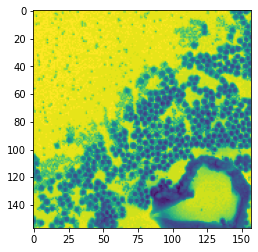

In [17]:
plt.imshow(abs(Overlap(Illuminate_frames(frames,illumination.conj())).get()/nl.get()))

**Test refine_illumination Operator**

In [18]:
frames = Illuminate_frames(Split(truth),illumination)

DD = xp.sum(Split(Overlap(xp.abs(frames) ** 2)),axis = 0) #R'DR

DD_inv = 1/xp.sqrt(DD)

print(DD_inv.shape)

(16, 16)


In [14]:
from wrap_ops import split_cuda, overlap_cuda

In [142]:
img0 = truth * 0 
frames0 = (xp.abs(frames) ** 2).astype(xp.complex64)
translations = (translations_x + 1j * translations_y).astype(xp.complex64)
overlap_cuda(img0, frames0, translations, illumination * 0 + 1)
print(img0[0,0])
print(xp.sum(split_cuda(img0, frames0* 0 ,translations,0),axis = 0)[0,0])
print(DD[0,0])

(2.509826+0j)
(1652.0596+0j)
1652.0596


In [19]:
print(xp.sum(illumination.conj() * xp.sum(frames * Split(Overlap( frames.conj() * Replicate_frame(illumination,nframes))),axis=0)))

(110198.46-0.00086635817j)


In [170]:
# Operator D^(-1/2)H D^(-1/2)
def DHD(a):
    b = DD_inv * xp.sum(frames * Split(Overlap(frames.conj() * Replicate_frame(DD_inv * a,nframes))),axis = 0)
    return b

In [28]:
print(xp.sum(illumination.conj() * DH(illumination)))

(110198.46-0.00086635817j)


In [31]:
a0 = xp.random.rand(16,16,dtype = xp.float32) + 1j*xp.random.rand(16,16,dtype = xp.float32)
a0 /= xp.linalg.norm(a0)

a1 = DHD(a0)
a2 = DHD(a1)
xp.allclose(a1,a2)

array(False)

In [175]:
a = a0
for _ in range(100):
    a = DHD(a)
    #a /= xp.linalg.norm(a)

#transform back
illum0 = DD_inv * a
illum0 *= xp.linalg.norm(illumination)/xp.linalg.norm(illum0)

In [176]:
phase=xp.dot(illum0.conj().ravel(),illumination.ravel())
phase /= xp.abs(phase)
print(phase)

(0.8349649-0.5503033j)


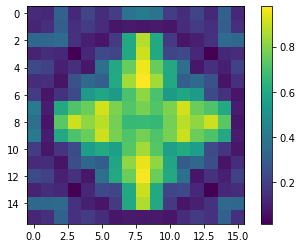

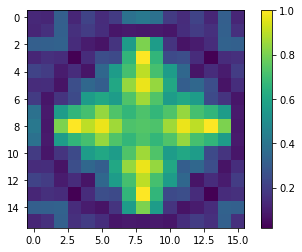

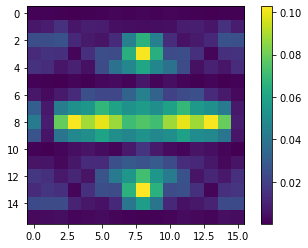

In [177]:
#reconstructed illumination
plt.imshow(abs(xp.reshape(illum0,(16,16)).get()))
plt.colorbar()
plt.show()

#true illumination
plt.imshow(abs(xp.reshape(illumination,(16,16)).get()))
plt.colorbar()
plt.show()

#difference, including common phase
phase=xp.dot(illum0.conj().ravel(),illumination.ravel())
phase=phase/xp.abs(phase)
plt.imshow(abs(xp.reshape(illumination-illum0*phase,(16,16)).get()))
plt.colorbar()
plt.show()


using GPU
loaded data, memory used, and total: 1281024 1282560
normalized by data.nbytes memory used and total normalized: 1.2216796875 1.22314453125
data size 1048576
----
Split and Overlap, memory used, and total: 1281024 1282560
normalized by data.nbytes memory used and total normalized: 1.2216796875 1.22314453125
data size 1048576
----
geometry: img size: (157, 157) frames: (16, 16, 1024)
not refining illumination, starting with good one, maxiter: 100
start AP memory used, and total: 4340224 36934144
normalized by data.nbytes memory used and total normalized: 4.13916015625 35.22314453125
data size 1048576
----
after Prox_data, memory used, and total: 4349440 36934144
normalized by data.nbytes memory used and total normalized: 4.14794921875 35.22314453125
----
after frames initial, memory used, and total: 6448640 36934144
normalized by data.nbytes memory used and total normalized: 6.14990234375 35.22314453125
----
start loop, memory used, and total: 6459904 36934144
normalized by da

  0%|          | 0/100 [00:00<?, ?it/s]

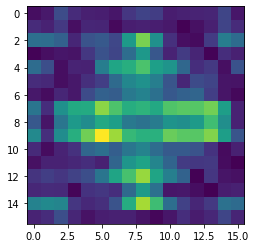

False


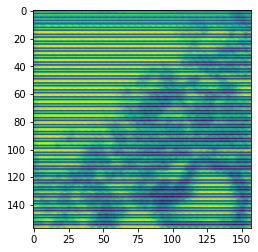

  1%|          | 1/100 [00:01<01:40,  1.02s/it]

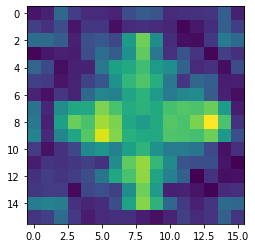

False


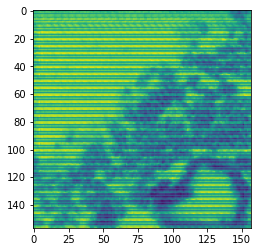

  2%|▏         | 2/100 [00:01<00:58,  1.68it/s]

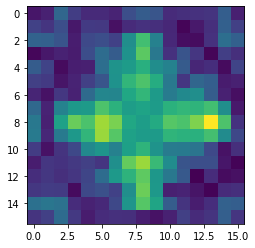

False


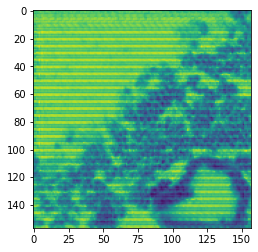

  3%|▎         | 3/100 [00:01<00:44,  2.17it/s]

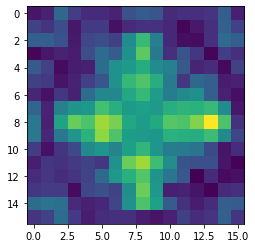

False


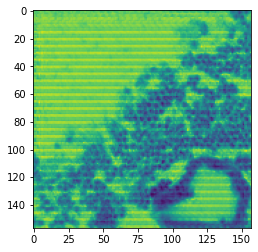

  4%|▍         | 4/100 [00:01<00:38,  2.52it/s]

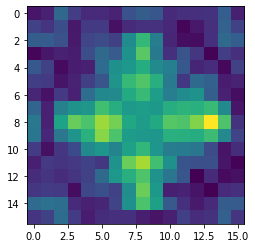

False


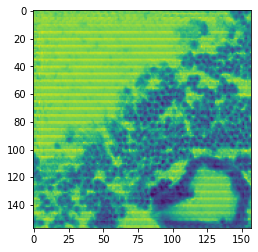

  5%|▌         | 5/100 [00:02<00:34,  2.77it/s]

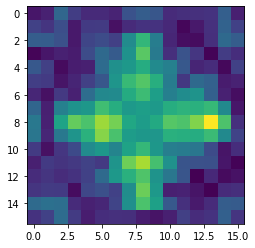

False


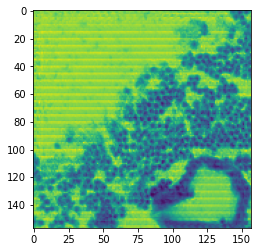

  6%|▌         | 6/100 [00:02<00:31,  2.95it/s]

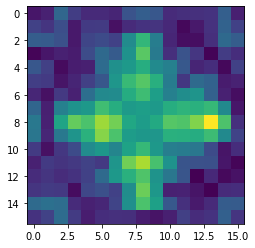

False


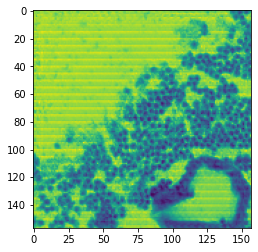

  7%|▋         | 7/100 [00:02<00:30,  3.07it/s]

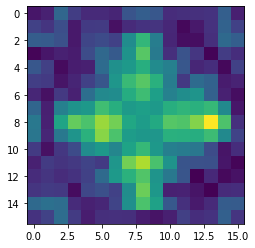

False


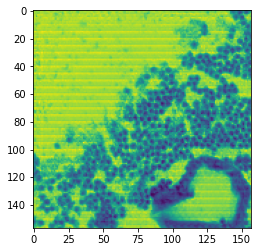

  8%|▊         | 8/100 [00:03<00:29,  3.15it/s]

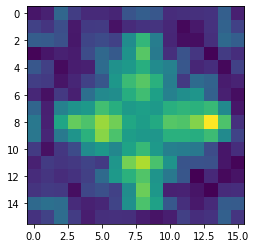

False


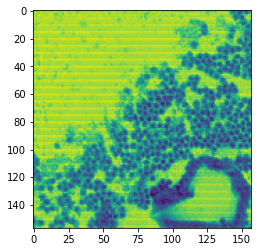

  9%|▉         | 9/100 [00:03<00:28,  3.21it/s]

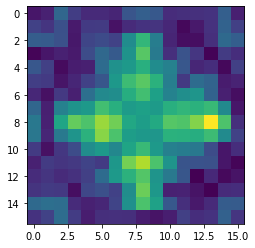

False


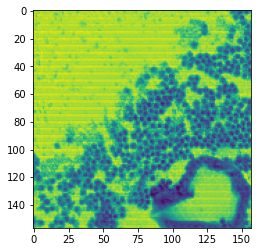

 10%|█         | 10/100 [00:03<00:27,  3.26it/s]

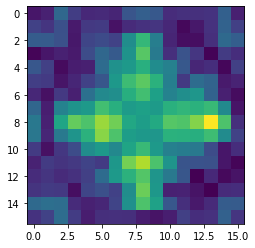

False


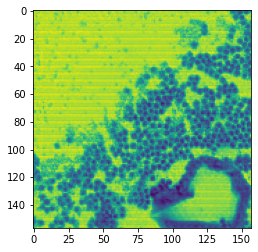

 11%|█         | 11/100 [00:04<00:29,  3.05it/s]

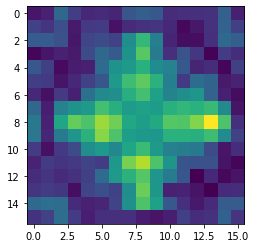

False


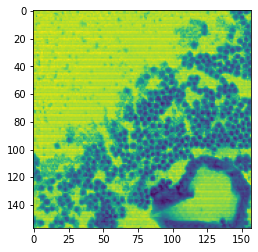

 12%|█▏        | 12/100 [00:04<00:27,  3.14it/s]

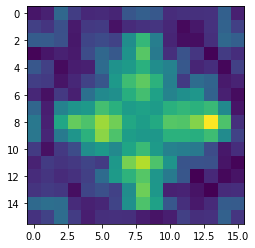

False


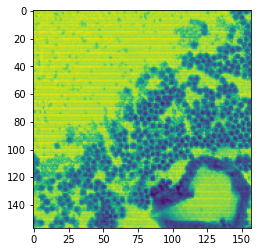

 13%|█▎        | 13/100 [00:04<00:27,  3.21it/s]

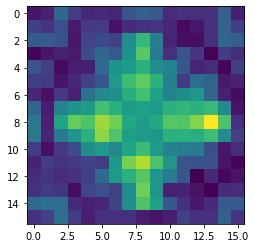

False


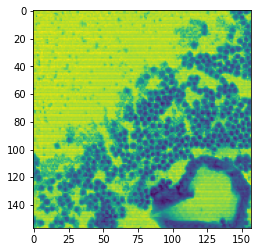

 14%|█▍        | 14/100 [00:04<00:26,  3.26it/s]

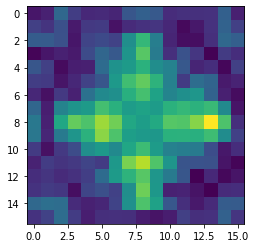

False


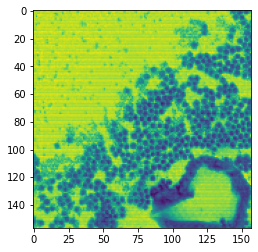

 15%|█▌        | 15/100 [00:05<00:25,  3.29it/s]

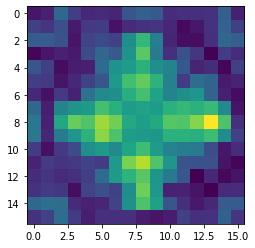

False


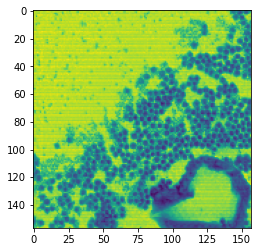

 16%|█▌        | 16/100 [00:05<00:25,  3.31it/s]

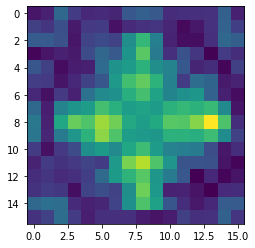

False


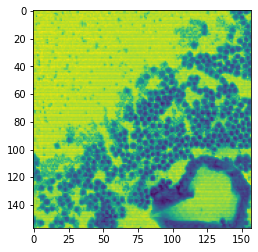

 17%|█▋        | 17/100 [00:05<00:24,  3.32it/s]

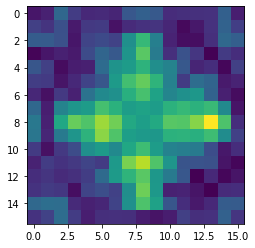

False


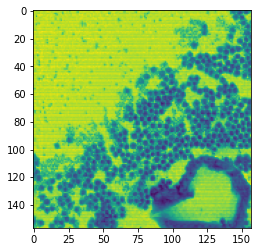

 18%|█▊        | 18/100 [00:06<00:24,  3.33it/s]

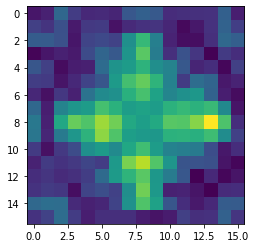

False


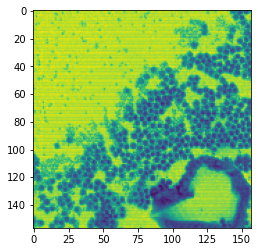

 19%|█▉        | 19/100 [00:06<00:24,  3.33it/s]

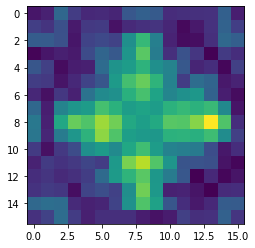

False


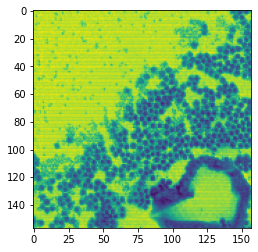

 20%|██        | 20/100 [00:06<00:23,  3.34it/s]

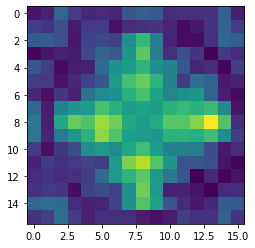

False


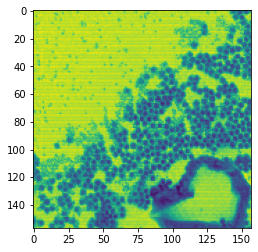

 21%|██        | 21/100 [00:07<00:23,  3.33it/s]

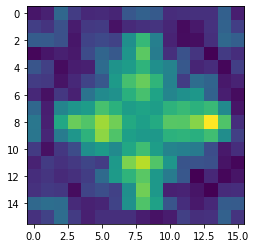

False


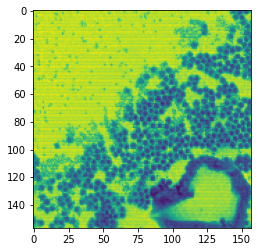

 22%|██▏       | 22/100 [00:07<00:25,  3.04it/s]

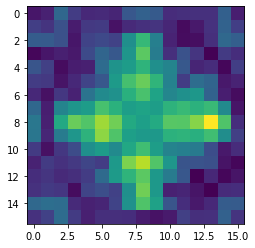

False


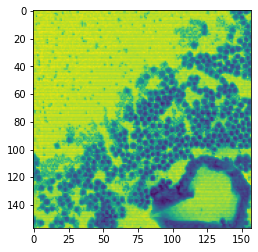

 23%|██▎       | 23/100 [00:07<00:24,  3.13it/s]

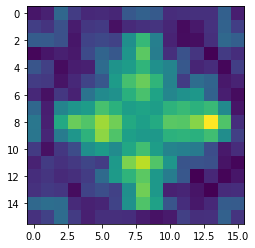

False


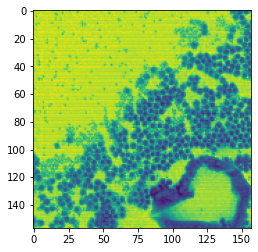

 24%|██▍       | 24/100 [00:08<00:23,  3.18it/s]

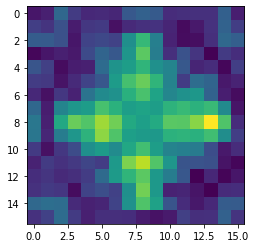

False


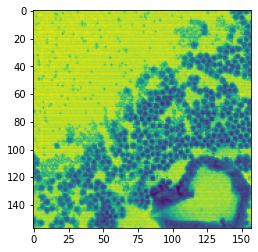

 25%|██▌       | 25/100 [00:08<00:23,  3.23it/s]

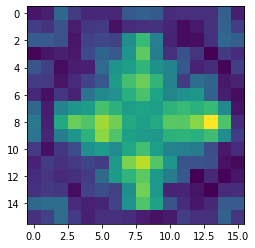

False


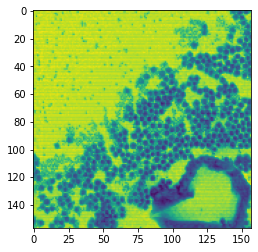

 26%|██▌       | 26/100 [00:08<00:22,  3.27it/s]

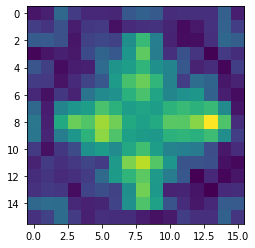

False


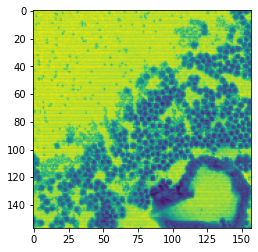

 27%|██▋       | 27/100 [00:08<00:22,  3.27it/s]

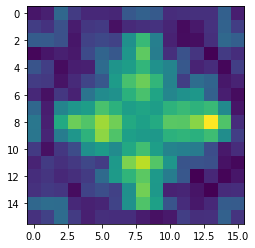

False


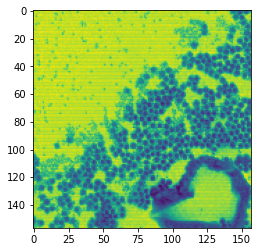

 28%|██▊       | 28/100 [00:09<00:21,  3.28it/s]

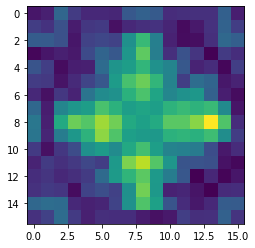

False


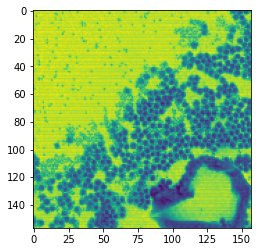

 29%|██▉       | 29/100 [00:09<00:21,  3.31it/s]

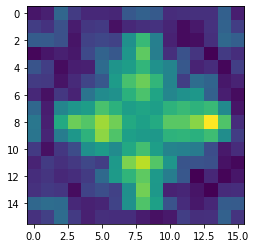

False


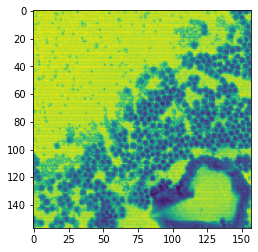

 30%|███       | 30/100 [00:09<00:21,  3.32it/s]

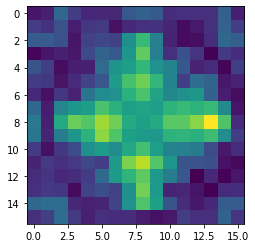

False


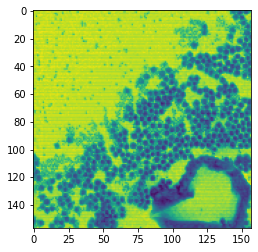

 31%|███       | 31/100 [00:10<00:20,  3.29it/s]

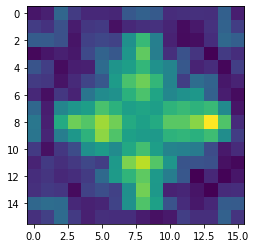

False


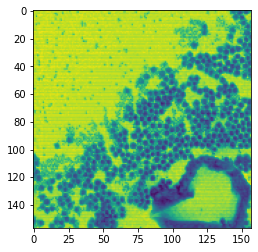

 32%|███▏      | 32/100 [00:10<00:20,  3.32it/s]

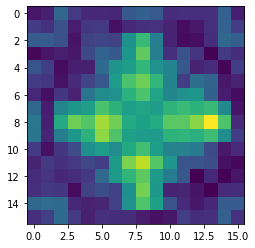

False


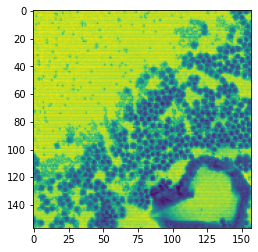

 33%|███▎      | 33/100 [00:10<00:21,  3.07it/s]

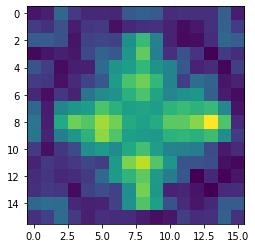

False


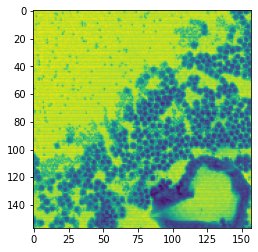

 34%|███▍      | 34/100 [00:11<00:20,  3.14it/s]

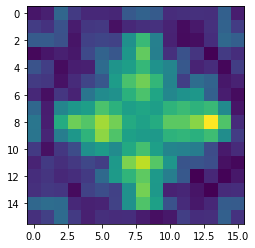

False


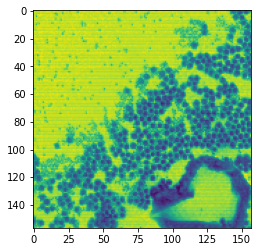

 35%|███▌      | 35/100 [00:11<00:20,  3.21it/s]

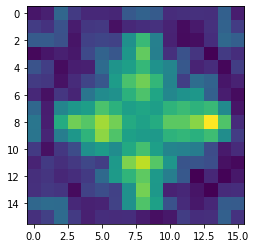

False


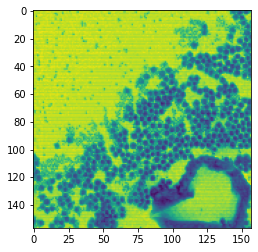

 36%|███▌      | 36/100 [00:11<00:19,  3.26it/s]

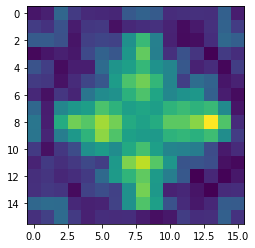

False


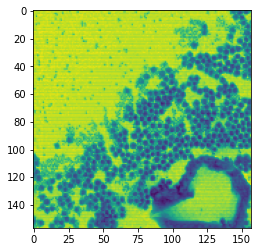

 37%|███▋      | 37/100 [00:12<00:19,  3.30it/s]

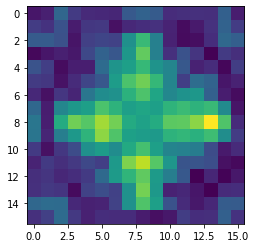

False


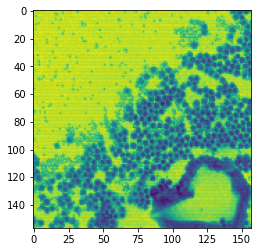

 38%|███▊      | 38/100 [00:12<00:18,  3.30it/s]

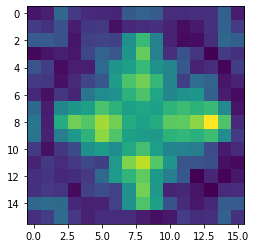

False


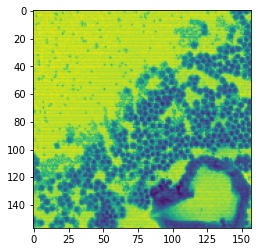

 39%|███▉      | 39/100 [00:12<00:18,  3.31it/s]

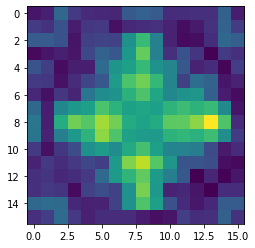

False


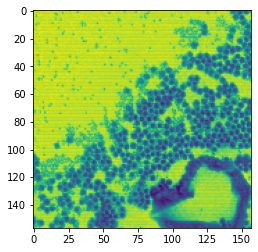

 40%|████      | 40/100 [00:12<00:18,  3.32it/s]

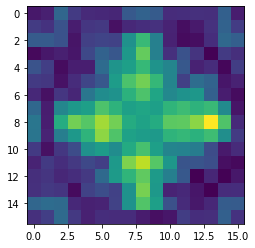

False


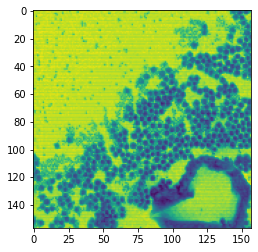

 41%|████      | 41/100 [00:13<00:17,  3.33it/s]

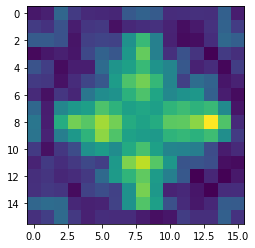

False


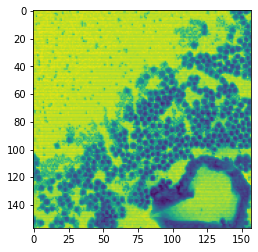

 42%|████▏     | 42/100 [00:13<00:17,  3.34it/s]

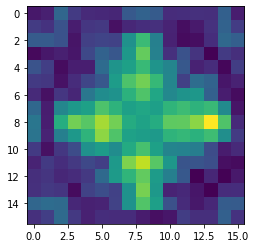

False


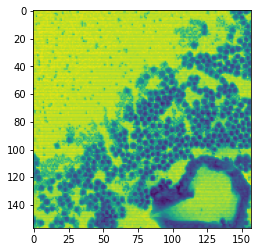

 43%|████▎     | 43/100 [00:13<00:19,  2.97it/s]

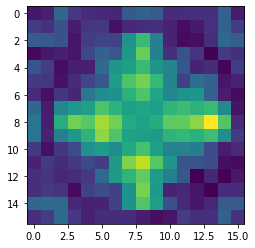

False


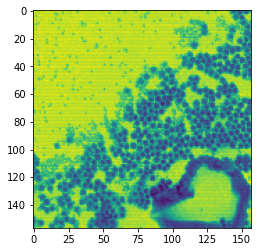

 44%|████▍     | 44/100 [00:14<00:18,  3.09it/s]

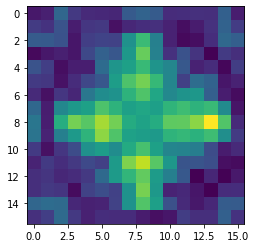

False


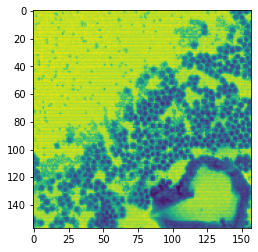

 45%|████▌     | 45/100 [00:14<00:17,  3.16it/s]

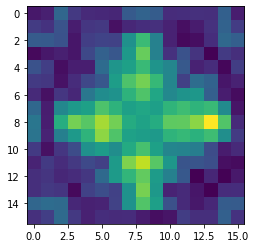

False


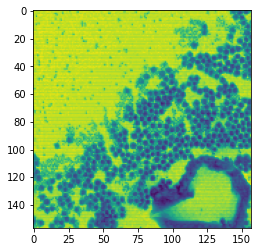

 46%|████▌     | 46/100 [00:14<00:16,  3.21it/s]

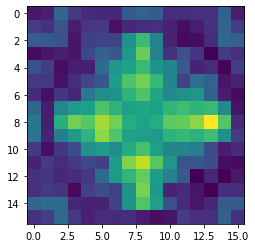

False


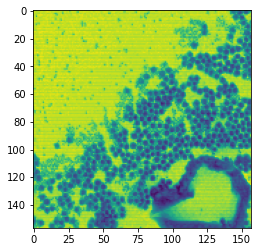

 47%|████▋     | 47/100 [00:15<00:16,  3.13it/s]

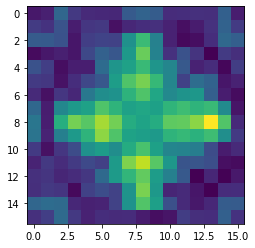

False


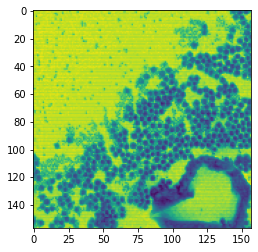

 48%|████▊     | 48/100 [00:15<00:16,  3.16it/s]

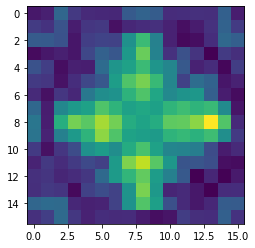

False


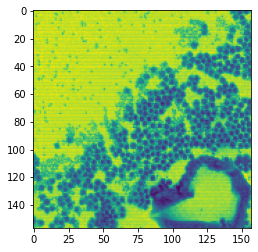

 49%|████▉     | 49/100 [00:15<00:15,  3.22it/s]

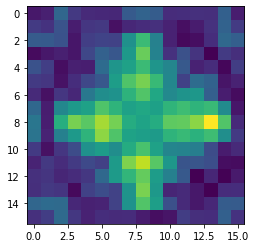

False


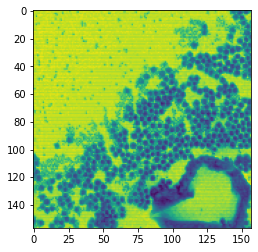

 50%|█████     | 50/100 [00:16<00:15,  3.26it/s]

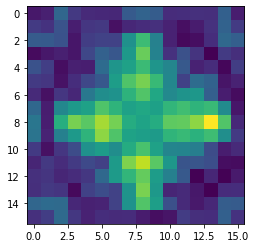

False


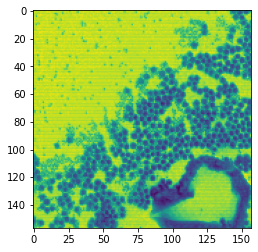

 51%|█████     | 51/100 [00:16<00:14,  3.30it/s]

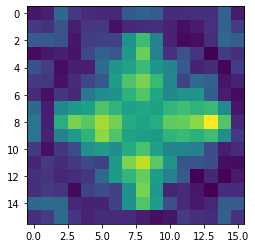

False


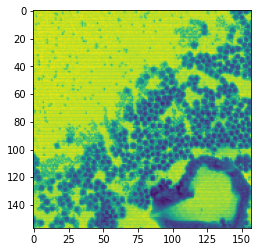

 52%|█████▏    | 52/100 [00:16<00:14,  3.33it/s]

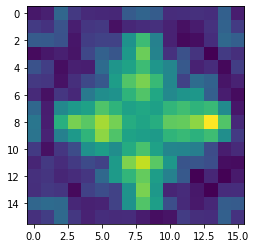

False


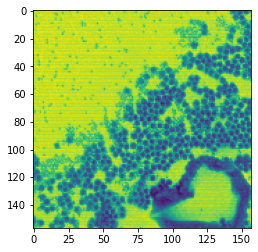

 53%|█████▎    | 53/100 [00:16<00:14,  3.33it/s]

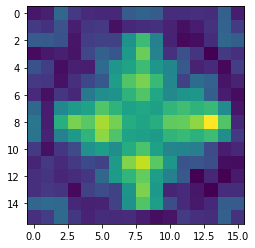

False


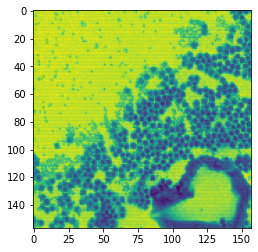

 54%|█████▍    | 54/100 [00:17<00:14,  3.11it/s]

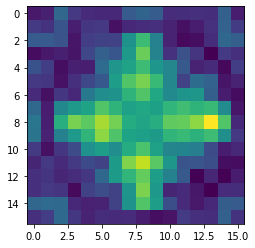

False


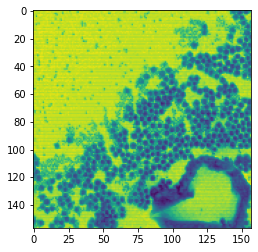

 55%|█████▌    | 55/100 [00:17<00:14,  3.19it/s]

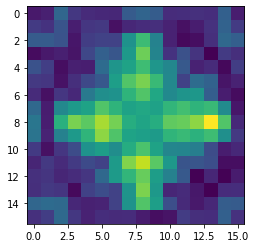

False


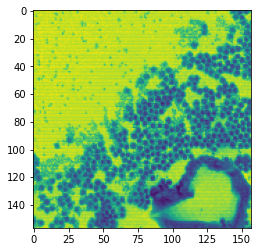

 56%|█████▌    | 56/100 [00:17<00:13,  3.23it/s]

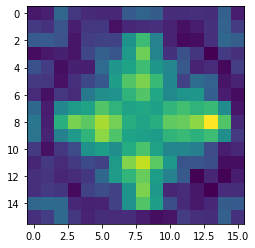

False


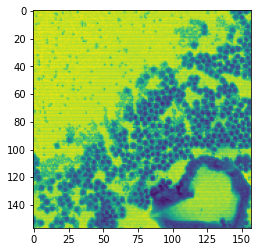

 57%|█████▋    | 57/100 [00:18<00:13,  3.24it/s]

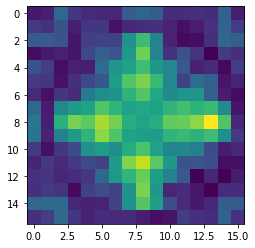

False


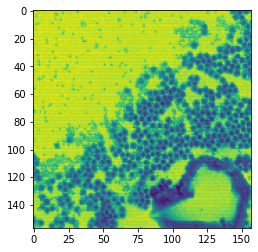

 58%|█████▊    | 58/100 [00:18<00:12,  3.29it/s]

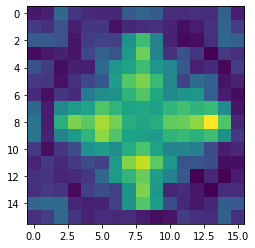

False


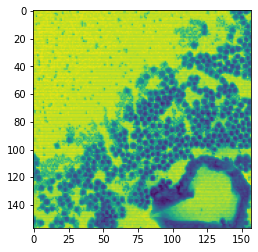

 59%|█████▉    | 59/100 [00:18<00:12,  3.30it/s]

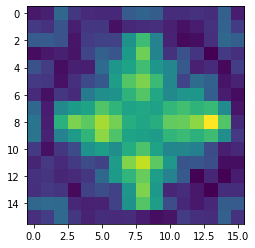

False


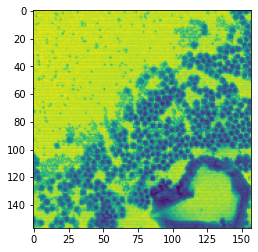

 60%|██████    | 60/100 [00:19<00:12,  3.32it/s]

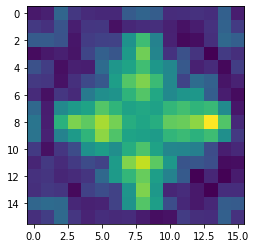

False


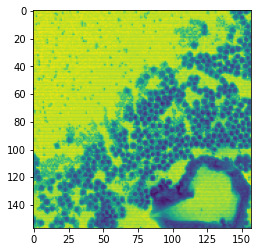

 61%|██████    | 61/100 [00:19<00:11,  3.33it/s]

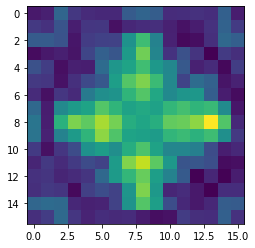

False


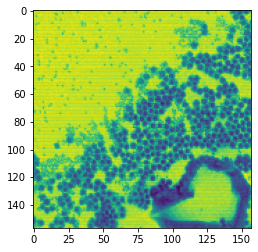

 62%|██████▏   | 62/100 [00:19<00:11,  3.35it/s]

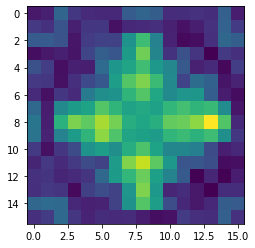

False


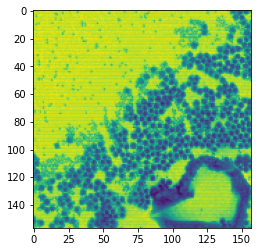

 63%|██████▎   | 63/100 [00:20<00:11,  3.35it/s]

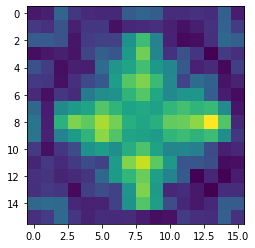

False


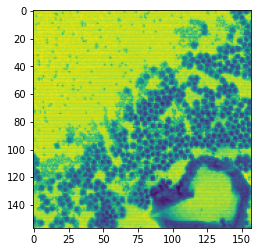

 64%|██████▍   | 64/100 [00:20<00:10,  3.31it/s]

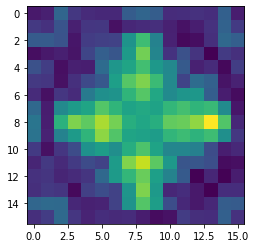

False


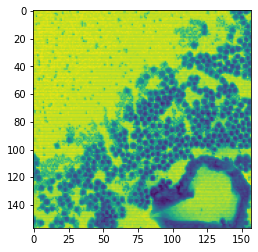

 65%|██████▌   | 65/100 [00:20<00:11,  3.08it/s]

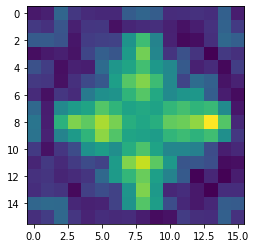

False


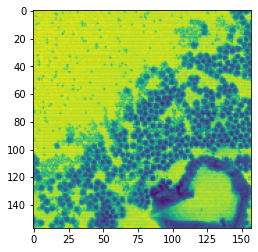

 66%|██████▌   | 66/100 [00:21<00:10,  3.17it/s]

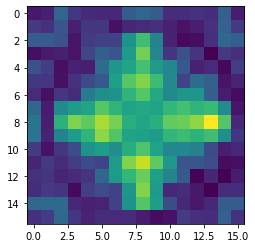

False


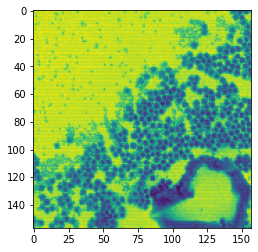

 67%|██████▋   | 67/100 [00:21<00:10,  3.23it/s]

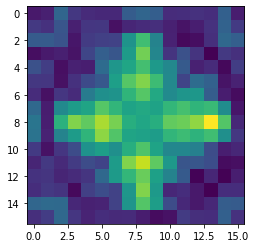

False


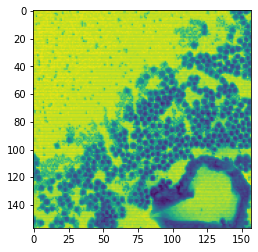

 68%|██████▊   | 68/100 [00:21<00:09,  3.27it/s]

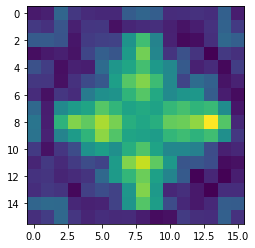

False


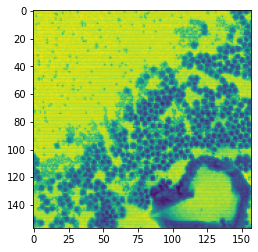

 69%|██████▉   | 69/100 [00:21<00:09,  3.30it/s]

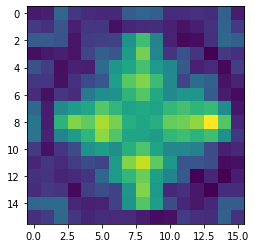

False


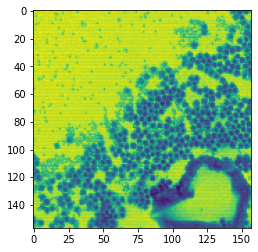

 70%|███████   | 70/100 [00:22<00:09,  3.31it/s]

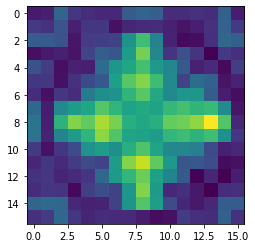

False


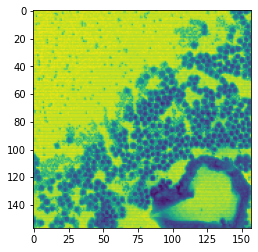

 71%|███████   | 71/100 [00:22<00:08,  3.33it/s]

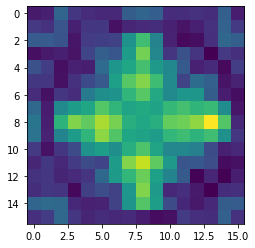

False


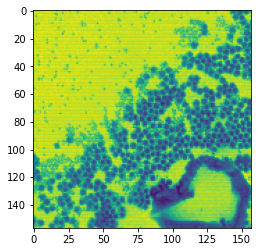

 72%|███████▏  | 72/100 [00:22<00:08,  3.34it/s]

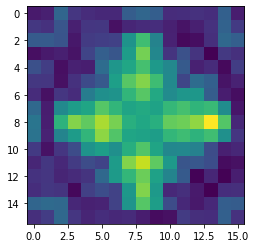

False


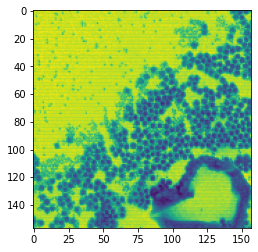

 73%|███████▎  | 73/100 [00:23<00:08,  3.34it/s]

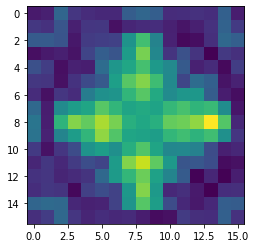

False


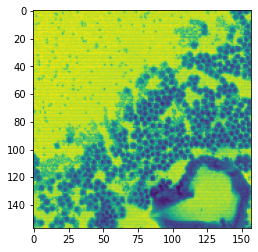

 74%|███████▍  | 74/100 [00:23<00:07,  3.34it/s]

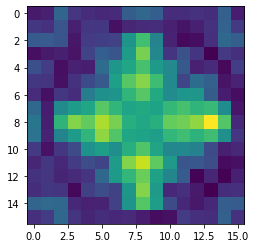

False


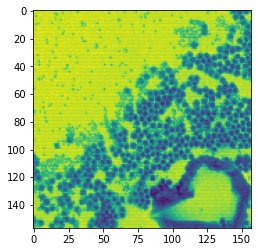

 75%|███████▌  | 75/100 [00:23<00:07,  3.34it/s]

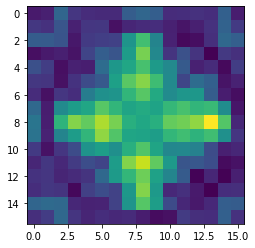

False


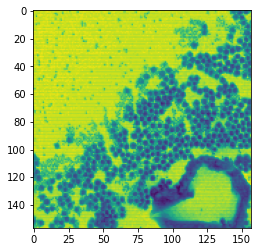

 76%|███████▌  | 76/100 [00:24<00:07,  3.10it/s]

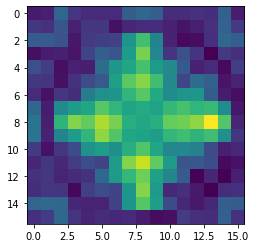

False


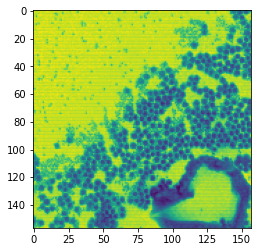

 77%|███████▋  | 77/100 [00:24<00:07,  3.17it/s]

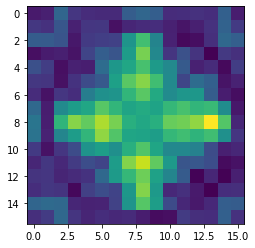

False


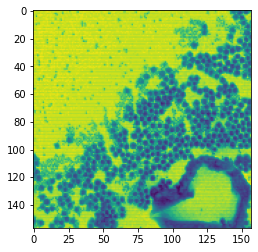

 78%|███████▊  | 78/100 [00:24<00:06,  3.22it/s]

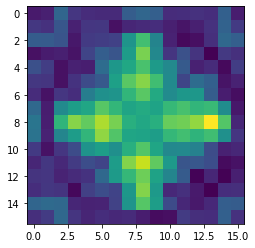

False


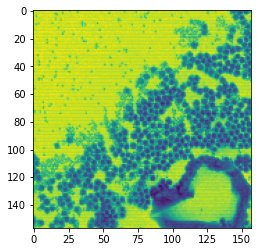

 79%|███████▉  | 79/100 [00:24<00:06,  3.27it/s]

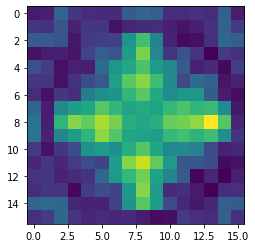

False


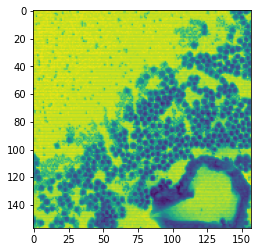

 80%|████████  | 80/100 [00:25<00:06,  3.29it/s]

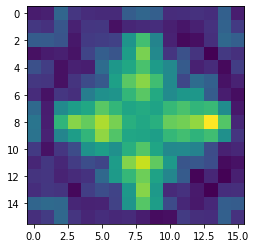

False


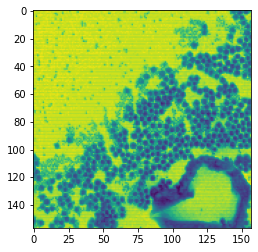

 81%|████████  | 81/100 [00:25<00:05,  3.31it/s]

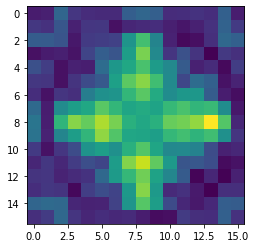

False


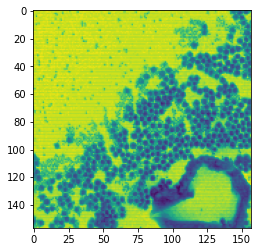

 82%|████████▏ | 82/100 [00:25<00:05,  3.33it/s]

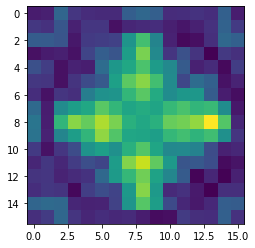

False


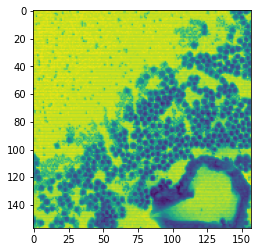

 83%|████████▎ | 83/100 [00:26<00:05,  3.35it/s]

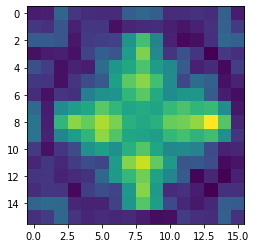

False


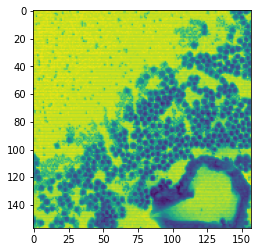

 84%|████████▍ | 84/100 [00:26<00:04,  3.36it/s]

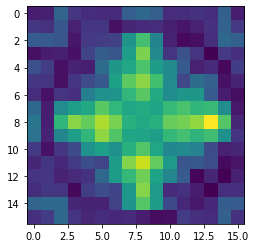

False


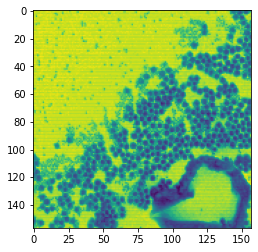

 85%|████████▌ | 85/100 [00:26<00:04,  3.37it/s]

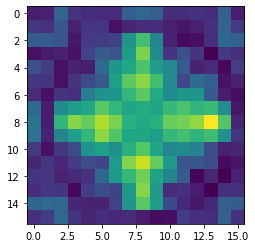

False


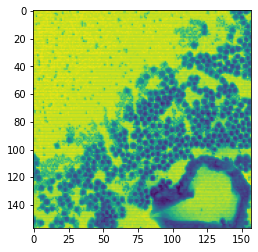

 86%|████████▌ | 86/100 [00:27<00:04,  3.35it/s]

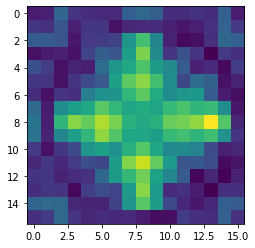

False


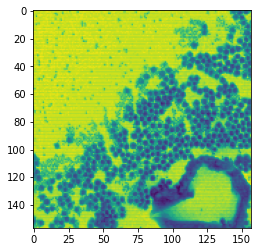

 87%|████████▋ | 87/100 [00:27<00:03,  3.34it/s]

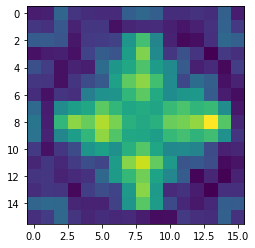

False


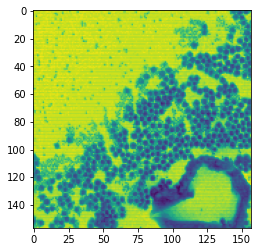

 88%|████████▊ | 88/100 [00:27<00:03,  3.10it/s]

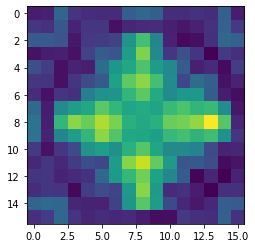

False


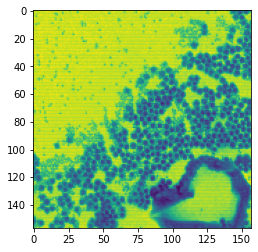

 89%|████████▉ | 89/100 [00:28<00:03,  3.18it/s]

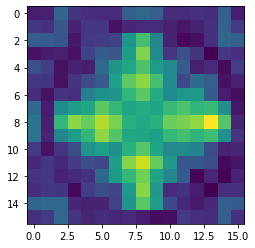

False


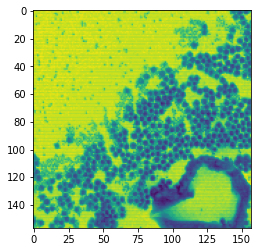

 90%|█████████ | 90/100 [00:28<00:03,  3.24it/s]

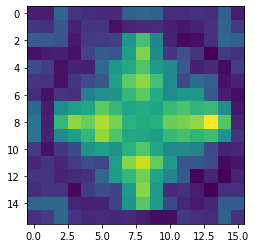

False


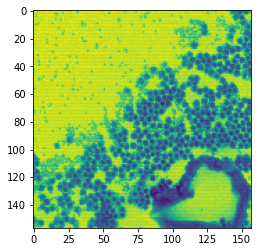

 91%|█████████ | 91/100 [00:28<00:02,  3.27it/s]

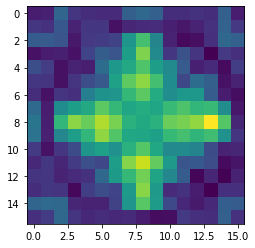

False


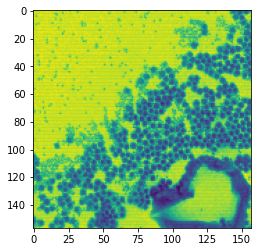

 92%|█████████▏| 92/100 [00:28<00:02,  3.28it/s]

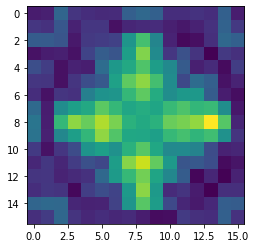

False


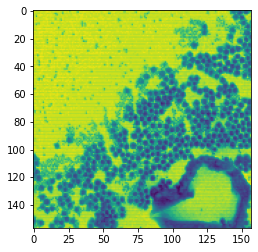

 93%|█████████▎| 93/100 [00:29<00:02,  3.30it/s]

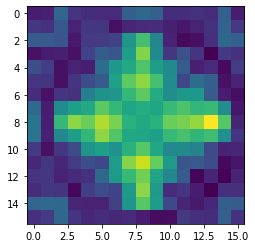

False


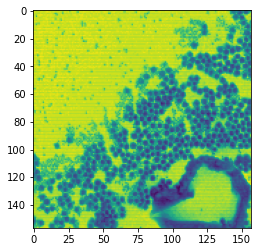

 94%|█████████▍| 94/100 [00:29<00:01,  3.31it/s]

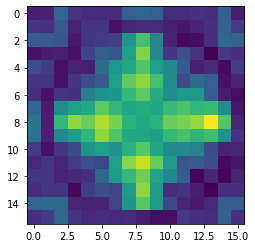

False


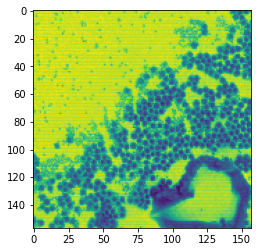

 95%|█████████▌| 95/100 [00:29<00:01,  3.32it/s]

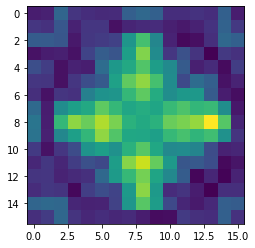

False


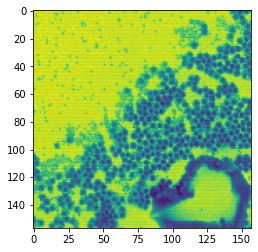

 96%|█████████▌| 96/100 [00:30<00:01,  3.33it/s]

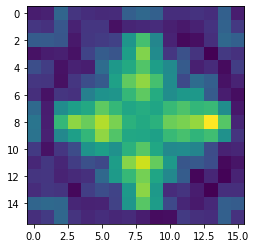

False


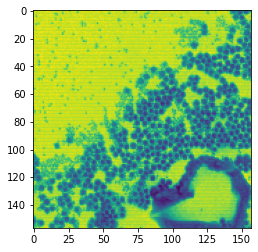

 97%|█████████▋| 97/100 [00:30<00:00,  3.32it/s]

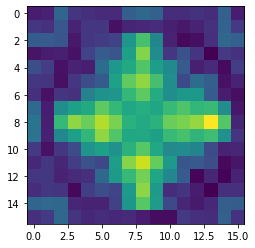

False


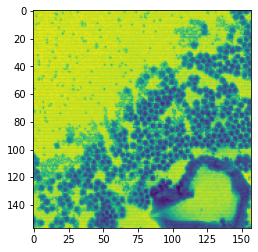

 98%|█████████▊| 98/100 [00:30<00:00,  3.13it/s]

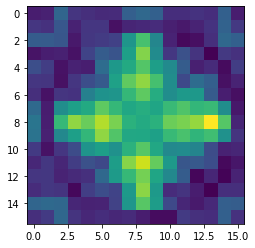

False


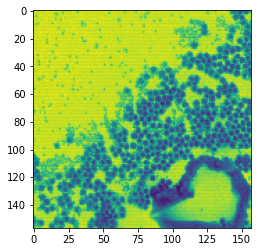

 99%|█████████▉| 99/100 [00:31<00:00,  3.20it/s]

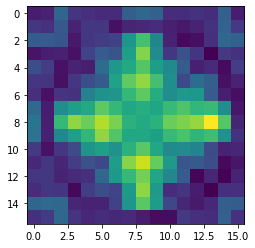

False


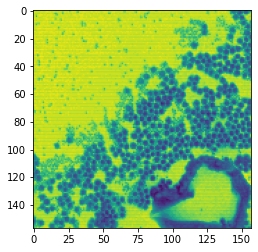

100%|██████████| 100/100 [00:31<00:00,  3.19it/s]

end of loop, memory used, and total/1e9: 0.010873344 0.036934144
normalized by data.nbytes memory used and total normalized: 10.36962890625 35.22314453125
----
total time: 31.715346940793097
{'Overlap': 0, 'Split': 0, 'Prox_data': 0.007844211533665657, 'Data_prox_tot': 0.505668225698173, 'Propagate': 0.46796562895178795, 'mse_data': 0.029582500457763672, 'Gramiam': 0.00011283718049526215, 'Gramiam_completion': 0.00026495661586523056, 'Precondition': 0, 'Eigensolver': 0.10862521547824144, 'Sync_setup': 7.801409810781479e-05, 'fd': 0}
total time operators benchmarked: 1.1201415900141
after normalization


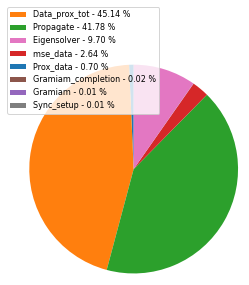

solver timers:
 {'solver_tot': 31.71495962049812, 'solver_loop': 31.373939010314643, 'ProxD': 0.5100326389074326, 'Overlap': 13.797633301466703, 'Sync': 0.31512586679309607, 'illuminate&split': 0.023046172223985195, 'refine_illumination': 16.58003373723477, 'mse_step': 0.0378887252882123, 'mse_truth': 0.05157455522567034, 'copies': 0.006482942961156368, 'loop_intrnl': 31.322331814095378, 'solver_final': 0.00872815866023302, 'solver_init': 0.3322887569665909}
solver timers after normalization by 31.373939010314643 :
 {'solver_tot': 1.0108695503638023, 'solver_loop': 1.0, 'ProxD': 0.01625657010233085, 'Overlap': 0.43978007660850393, 'Sync': 0.010044191986524032, 'illuminate&split': 0.0007345641940722977, 'refine_illumination': 0.5284651612213513, 'mse_step': 0.0012076496124938543, 'mse_truth': 0.001643866114762142, 'copies': 0.00020663465174153, 'loop_intrnl': 0.9983550934996623, 'solver_final': 0.0002781977314790951, 'solver_init': 0.010591234873547312}
mse timings: 0.03243401618501967


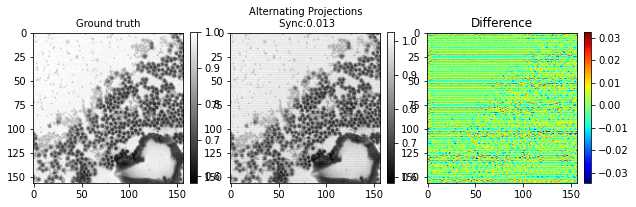

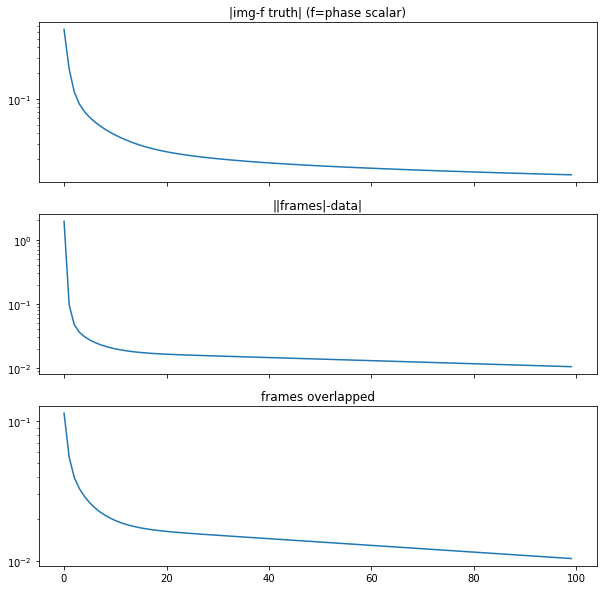

solver tot (seconds) : 31.71495962049812 loop: 31.373939010314643 seconds
proxD : 1.625657010233085 %
Overlap : 43.978007660850395 %
illuminate and split : 0.07345641940722977 %
mse: 0.37944161532445214 %
proxD (propagate(ffts), mse, prox)%: (92.54400517368293, 5.850179812449021, 1.551256562113469)


In [1]:
fname_in ="poster_32x32.h5"
%run -i ptycho_reconstruct.py 

In [3]:
a = xp.random.rand(2,2)

In [1]:
fname_in = "simulation_test16161024.h5"

using GPU
loaded data, memory used, and total: 1281024 1282560
normalized by data.nbytes memory used and total normalized: 1.2216796875 1.22314453125
data size 1048576
----
Split and Overlap, memory used, and total: 4525568 23315456
normalized by data.nbytes memory used and total normalized: 4.31591796875 22.2353515625
data size 1048576
----
geometry: img size: (157, 157) frames: (16, 16, 1024)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 9945600 65258496
normalized by data.nbytes memory used and total normalized: 9.48486328125 62.2353515625
data size 1048576
----
after Prox_data, memory used, and total: 9946624 65258496
normalized by data.nbytes memory used and total normalized: 9.48583984375 62.2353515625
----
after frames initial, memory used, and total: 12043776 65258496
normalized by data.nbytes memory used and total normalized: 11.48583984375 62.2353515625
----
start loop, memory used, and total: 13192192 65258496
normalized by d

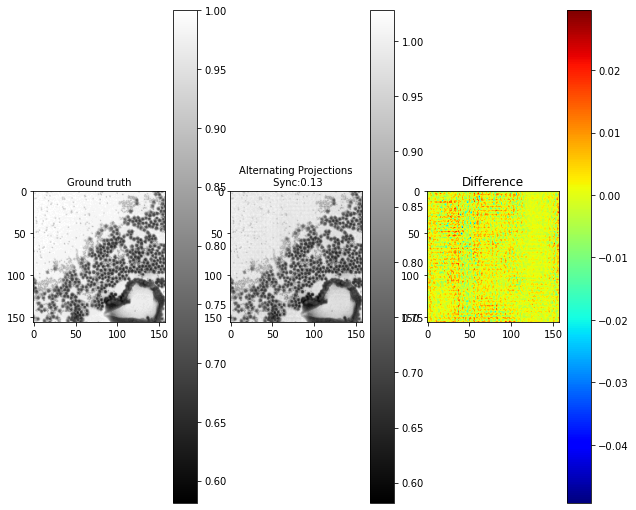

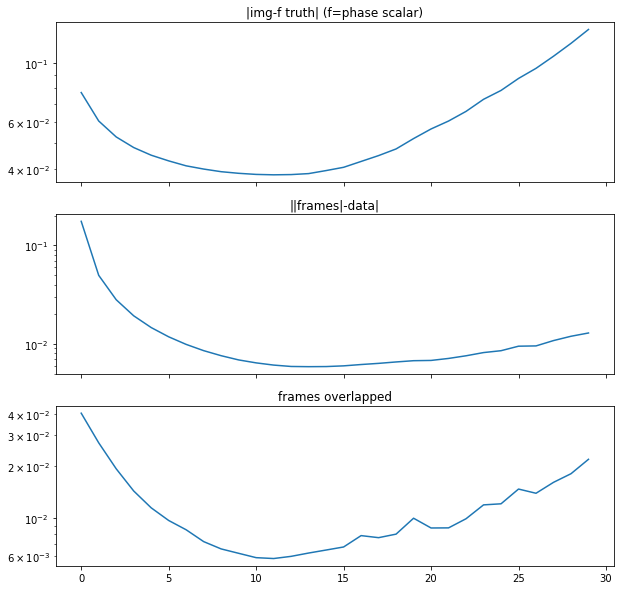

solver tot (seconds) : 5.392578608123586 loop: 5.313580567017198 seconds
proxD : 18.053408529434787 %
Overlap : 0.16515658656822133 %
illuminate and split : 0.055482532415629275 %
mse: 0.520413831726898 %
proxD (propagate(ffts), mse, prox)%: (97.70813046441886, 1.4419952504032476, 0.8354459380619834)


In [2]:
%run ptycho_reconstruct.py $fname_in

using GPU
loaded data, memory used, and total: 1281024 1282560
normalized by data.nbytes memory used and total normalized: 1.2216796875 1.22314453125
data size 1048576
----
Split and Overlap, memory used, and total: 4525568 23315456
normalized by data.nbytes memory used and total normalized: 4.31591796875 22.2353515625
data size 1048576
----
geometry: img size: (157, 157) frames: (16, 16, 1024)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 4723200 23315456
normalized by data.nbytes memory used and total normalized: 4.50439453125 22.2353515625
data size 1048576
----
after Prox_data, memory used, and total: 4724224 23315456
normalized by data.nbytes memory used and total normalized: 4.50537109375 22.2353515625
----
after frames initial, memory used, and total: 6821376 23315456
normalized by data.nbytes memory used and total normalized: 6.50537109375 22.2353515625
----
start loop, memory used, and total: 6921216 23315456
normalized by data

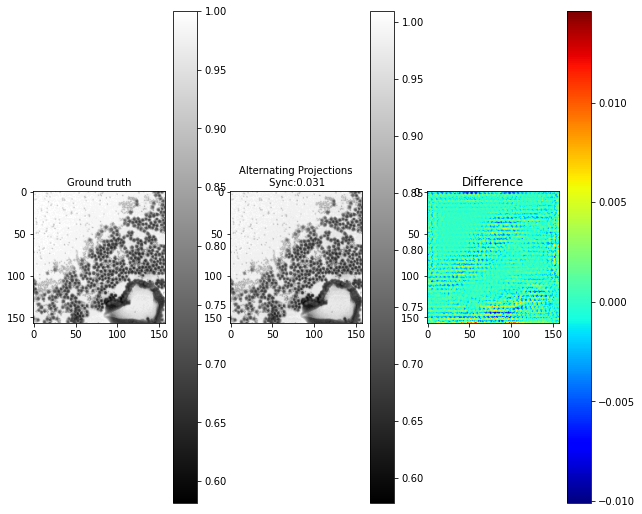

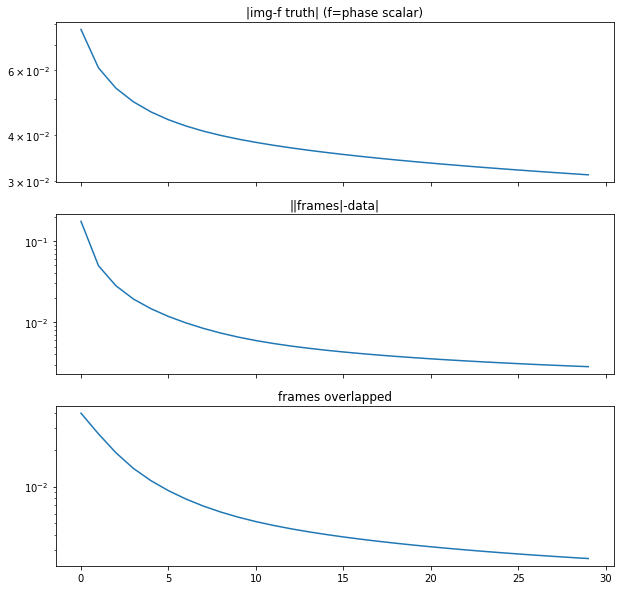

solver tot (seconds) : 0.5197322971653193 loop: 0.49553778604604304 seconds
proxD : 90.9823553977 %
Overlap : 2.503323674166948 %
illuminate and split : 0.5918727153341097 %
mse: 6.084354612728244 %
proxD (propagate(ffts), mse, prox)%: (97.88887452809885, 1.3450430462191214, 0.7516762575284855)


In [3]:
%run ptycho_reconstruct.py $fname_in

In [1]:
%run ptycho_simulate.py

type0 <class 'numpy.ndarray'> int64


In [2]:
fname_in = "simulation_test_test.h5"

using CPU
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
total time: 0.6404055620077997
{'Overlap': 0.0023412895388901234, 'Split': 0.002215833170339465, 'Prox_data': 0.007477054838091135, 'Data_prox_tot': 0.035071836318820715, 'Propagate': 0.01877740607596934, 'mse_data': 0.008767594117671251, 'Gramiam': 0.4797529629431665, 'Gramiam_completion': 0.025483880890533328, 'Precondition': 0.032390243373811245, 'Eigensolver': 0.045257320161908865, 'Sync_setup': 7.441733032464981e-06, 'fd': 0}
total time operators benchmarked: 0.6575428631622344
after normalization
{'Overlap': 0.003560664513383154, 'Split': 0.0033698687864744665, 'Prox_data': 0.011371205220193126, 'Data_prox_tot': 0.05333771877646781, 'Propagate': 0.028556930852637694, 'mse_data': 0.013333874654963806, 'Gramiam': 0.7296147366514688, 'Gramiam_completion': 0.03875622764419805, 'Precon

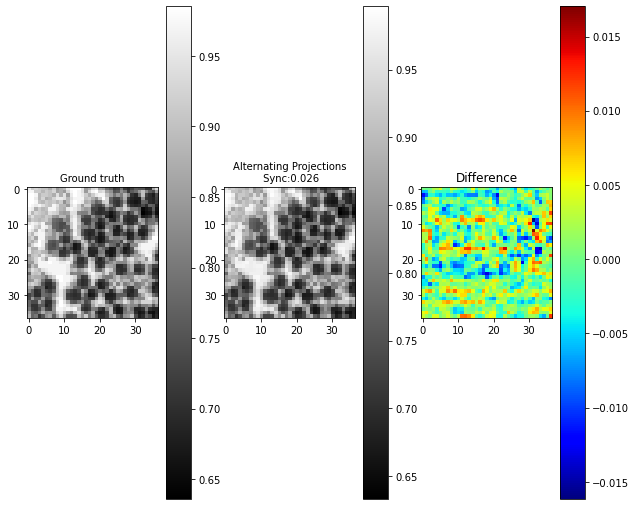

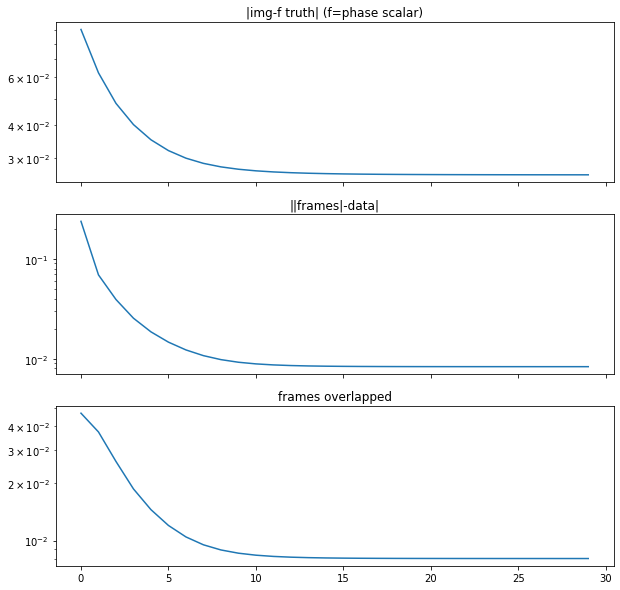

solver tot (seconds) : 0.640376356896013 loop: 0.6400219171773642 seconds
proxD : 5.525750945304697 %
Overlap : 0.7082317939857338 %
illuminate and split : 0.6106064107170097 %
mse: 2.2026129082244177 %
proxD (propagate(ffts), mse, prox)%: (53.53984292488489, 24.998959387154382, 21.31925676808288)


In [3]:
%run ptycho_reconstruct.py $fname_in

using CPU
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
total time: 0.02900456706993282
{'Overlap': 0.002010058145970106, 'Split': 0.0019305665045976639, 'Prox_data': 0.00375431589782238, 'Data_prox_tot': 0.0179146493319422, 'Propagate': 0.012103258864954114, 'mse_data': 0.002016127808019519, 'Gramiam': 0, 'Gramiam_completion': 0, 'Precondition': 0, 'Eigensolver': 0, 'Sync_setup': 0, 'fd': 0}
total time operators benchmarked: 0.039728976553305984
after normalization
{'Overlap': 0.05059425941348198, 'Split': 0.04859341146146426, 'Prox_data': 0.09449817799321011, 'Data_prox_tot': 0.45092149071359505, 'Propagate': 0.3046456243018161, 'mse_data': 0.050747036116432505, 'Gramiam': 0.0, 'Gramiam_completion': 0.0, 'Precondition': 0.0, 'Eigensolver': 0.0, 'Sync_setup': 0.0, 'fd': 0.0}
solver timers:
 {'solver_tot': 14.337581007872231, 'solver_loop': 

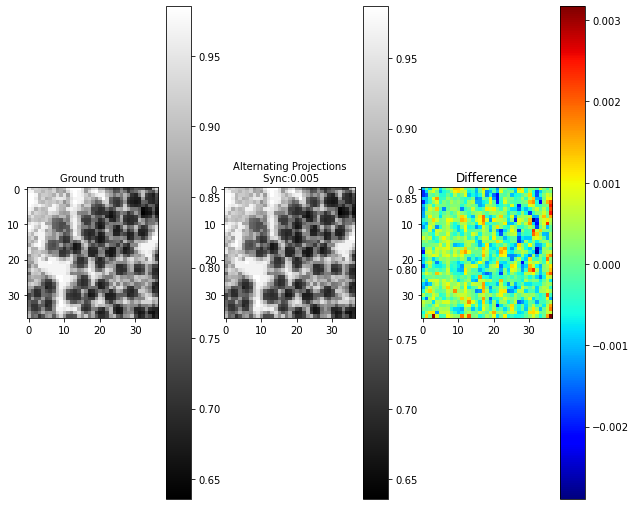

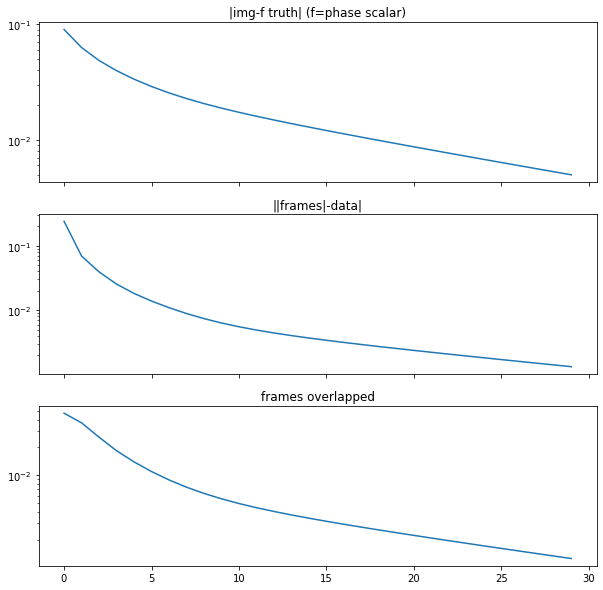

solver tot (seconds) : 14.337581007872231 loop: 0.02865637093782425 seconds
proxD : 2820.9195748728403 %
Overlap : 366.01473842454675 %
illuminate and split : 314.85091637918725 %
mse: 433.1583405169388 %
proxD (propagate(ffts), mse, prox)%: (67.5606797581784, 11.254073527549993, 20.95668091659687)


In [4]:
%run ptycho_reconstruct.py $fname_in

In [1]:
%run ptycho_simulate.py

type0 <class 'numpy.ndarray'> int64


In [1]:
fname_in = "simulation_small.h5"

using CPU
geometry: img size: (77, 77) frames: (16, 16, 256)
not refining illumination, starting with good one, maxiter: 100
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
total time: 21.51513358601369
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
total time: 40.87273010984063
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81

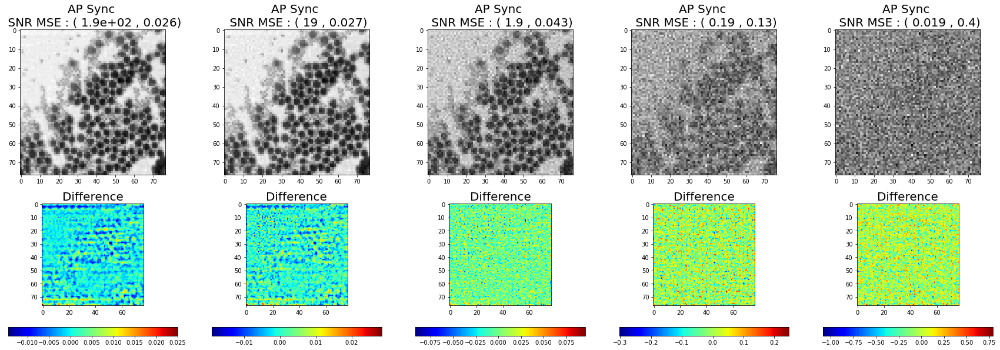

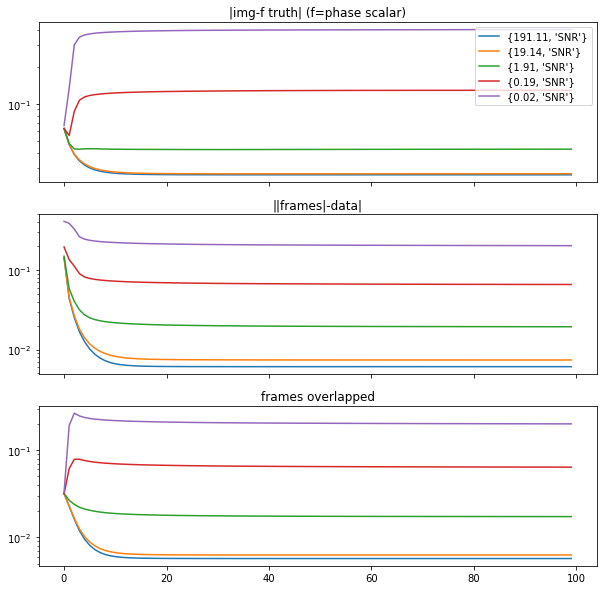

In [2]:
%run sync_noise_test $fname_in

In [2]:
%run ptycho_simulate.py

type0 <class 'cupy.ndarray'> int64


Using Gramiam_cuda

using GPU
loaded data, memory used, and total: 80896 82432
normalized by data.nbytes memory used and total normalized: 1.234375 1.2578125
data size 65536
----
Split and Overlap, memory used, and total: 283136 1464320
normalized by data.nbytes memory used and total normalized: 4.3203125 22.34375
data size 65536
----
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 382464 1464320
normalized by data.nbytes memory used and total normalized: 5.8359375 22.34375
data size 65536
----
after Prox_data, memory used, and total: 383488 1464320
normalized by data.nbytes memory used and total normalized: 5.8515625 22.34375
----
after frames initial, memory used, and total: 514560 1464320
normalized by data.nbytes memory used and total normalized: 7.8515625 22.34375
----
start loop, memory used, and total: 586752 1464320
normalized by data.nbytes memory used and total normalized: 8.953125 22.34375
----
0
1

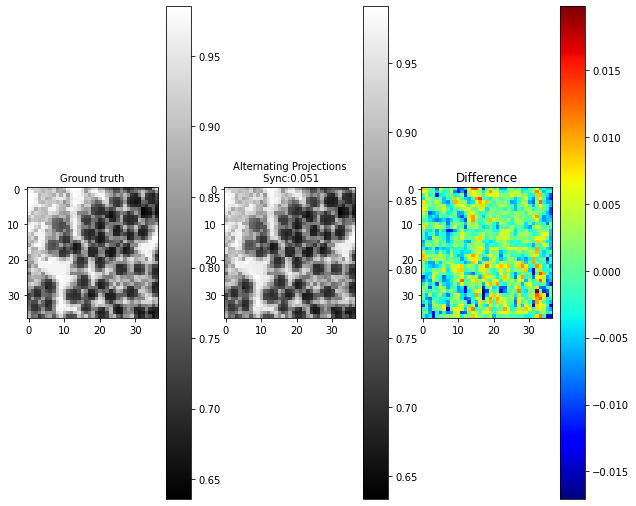

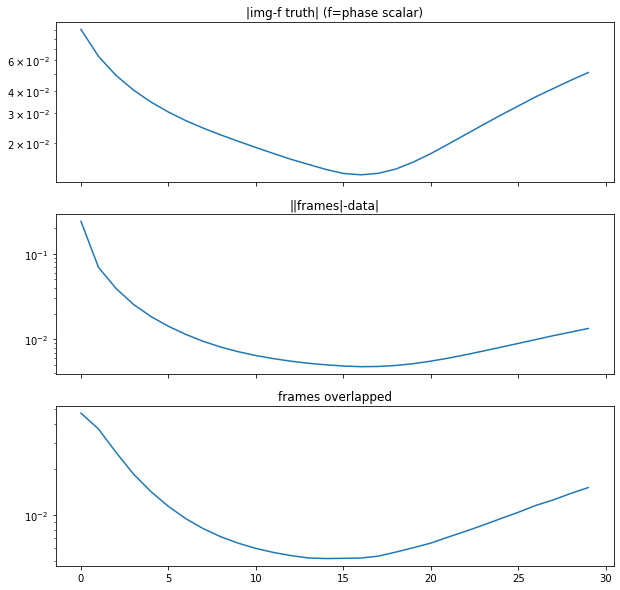

solver tot (seconds) : 7.900045708985999 loop: 7.874942146940157 seconds
proxD : 5.692612651301334 %
Overlap : 0.10702083130367396 %
illuminate and split : 0.03704861532981881 %
mse: 0.353616826876297 %
proxD (propagate(ffts), mse, prox)%: (97.85499302369148, 1.3790292036629945, 0.7513988643481199)


In [ ]:
%run ptycho_reconstruct.py

Using Gramiam no cuda

In [1]:
%run ptycho_simulate.py

type0 <class 'cupy.ndarray'> int64


using GPU
loaded data, memory used, and total: 80896 82432
normalized by data.nbytes memory used and total normalized: 1.234375 1.2578125
data size 65536
----
Split and Overlap, memory used, and total: 283136 1464320
normalized by data.nbytes memory used and total normalized: 4.3203125 22.34375
data size 65536
----
[[  0   5  10 ... -14  -9  -4]
 [ -5   0   5 ...  18 -14  -9]
 [-10  -5   0 ...  13  18 -14]
 ...
 [ 14 -18 -13 ...   0   5  10]
 [  9  14 -18 ...  -5   0   5]
 [  4   9  14 ... -10  -5   0]] (64, 64)
[[ 0  0  0 ... -2 -2 -2]
 [ 0  0  0 ... -2 -2 -2]
 [ 0  0  0 ... -2 -2 -2]
 ...
 [ 2  2  2 ...  0  0  0]
 [ 2  2  2 ...  0  0  0]
 [ 2  2  2 ...  0  0  0]] (64, 64)
Hi
(1584,)
[ 0  0  0 ... 62 62 63]
(1584,)
[ 0  1  2 ... 62 63 63]
Bye
before int64
after int64
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 358400 1464320
normalized by data.nbytes memory used and total normalized: 

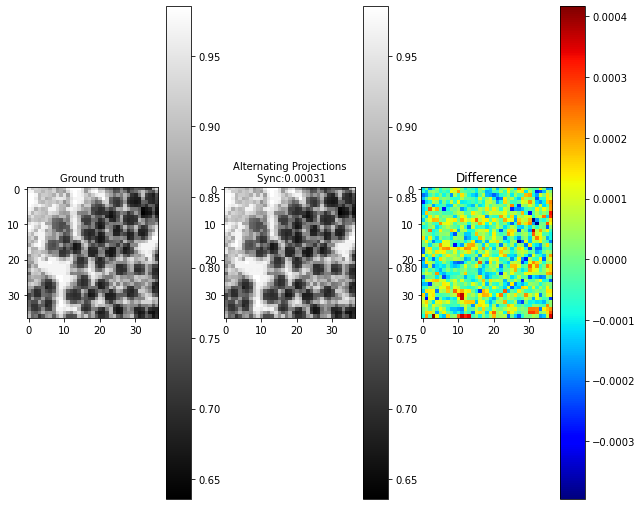

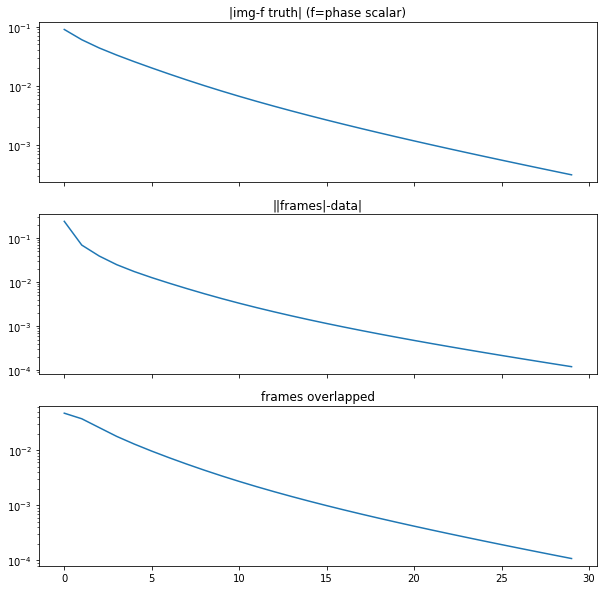

solver tot (seconds) : 2.2459202189929783 loop: 1.8493344851303846 seconds
proxD : 24.551184311323315 %
Overlap : 0.4607999513918408 %
illuminate and split : 0.21539858664397973 %
mse: 1.5882647117584137 %
proxD (propagate(ffts), mse, prox)%: (97.5315122313264, 1.525513092190476, 0.9281635114455287)


In [1]:
%run ptycho_reconstruct.py

using GPU
loaded data, memory used, and total: 80896 82432
normalized by data.nbytes memory used and total normalized: 1.234375 1.2578125
data size 65536
----
Split and Overlap, memory used, and total: 283136 1464320
normalized by data.nbytes memory used and total normalized: 4.3203125 22.34375
data size 65536
----
[[  0   5  10 ... -14  -9  -4]
 [ -5   0   5 ...  18 -14  -9]
 [-10  -5   0 ...  13  18 -14]
 ...
 [ 14 -18 -13 ...   0   5  10]
 [  9  14 -18 ...  -5   0   5]
 [  4   9  14 ... -10  -5   0]] (64, 64)
[[ 0  0  0 ... -2 -2 -2]
 [ 0  0  0 ... -2 -2 -2]
 [ 0  0  0 ... -2 -2 -2]
 ...
 [ 2  2  2 ...  0  0  0]
 [ 2  2  2 ...  0  0  0]
 [ 2  2  2 ...  0  0  0]] (64, 64)
Hi
(1584,)
[ 0  0  0 ... 62 62 63]
(1584,)
[ 0  1  2 ... 62 63 63]
Bye
before int64
after int64
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 358400 1464320
normalized by data.nbytes memory used and total normalized: 

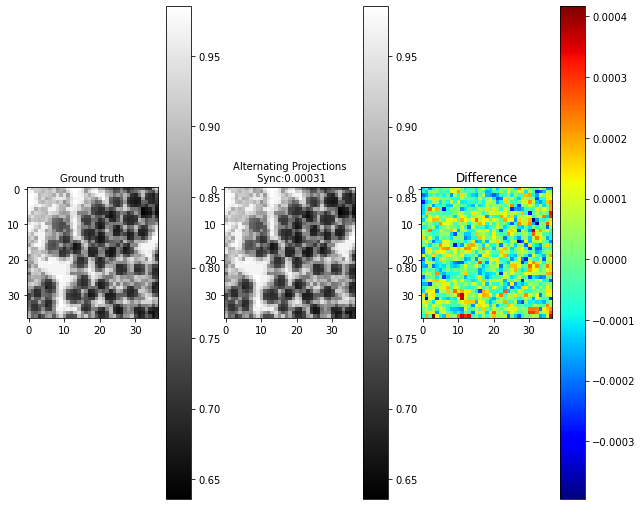

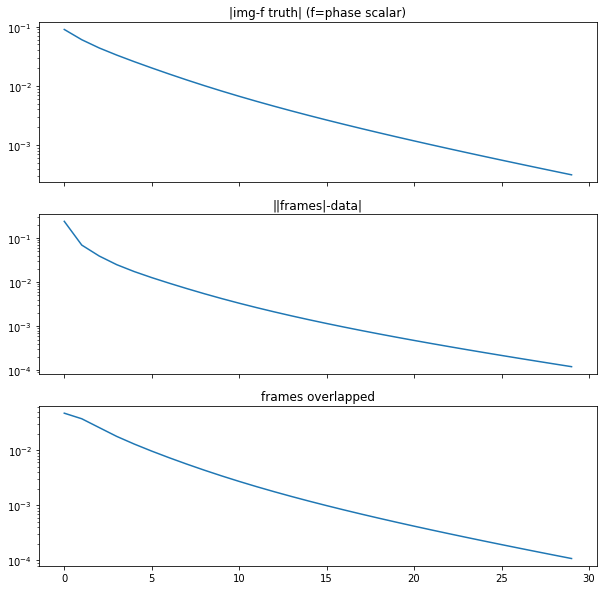

solver tot (seconds) : 2.3972230879589915 loop: 2.3691050179768354 seconds
proxD : 19.239314576132617 %
Overlap : 0.35681891310374203 %
illuminate and split : 0.17011787868757886 %
mse: 1.2305952549533947 %
proxD (propagate(ffts), mse, prox)%: (97.56797525782777, 1.5069713716900413, 0.9097392191590441)


In [1]:
%run ptycho_reconstruct.py

using GPU
loaded data, memory used, and total: 80896 82432
normalized by data.nbytes memory used and total normalized: 1.234375 1.2578125
data size 65536
----
Split and Overlap, memory used, and total: 283136 1464320
normalized by data.nbytes memory used and total normalized: 4.3203125 22.34375
data size 65536
----
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 358400 1464320
normalized by data.nbytes memory used and total normalized: 5.46875 22.34375
data size 65536
----
after Prox_data, memory used, and total: 359424 1464320
normalized by data.nbytes memory used and total normalized: 5.484375 22.34375
----
after frames initial, memory used, and total: 490496 1464320
normalized by data.nbytes memory used and total normalized: 7.484375 22.34375
----
start loop, memory used, and total: 563200 1464320
normalized by data.nbytes memory used and total normalized: 8.59375 22.34375
----
0
1
2
3


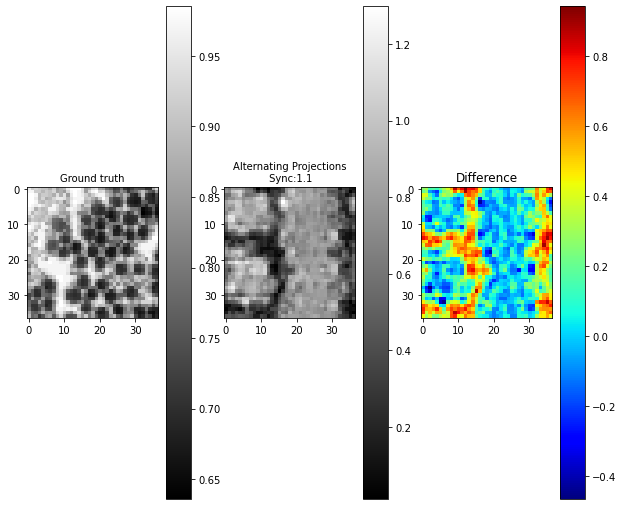

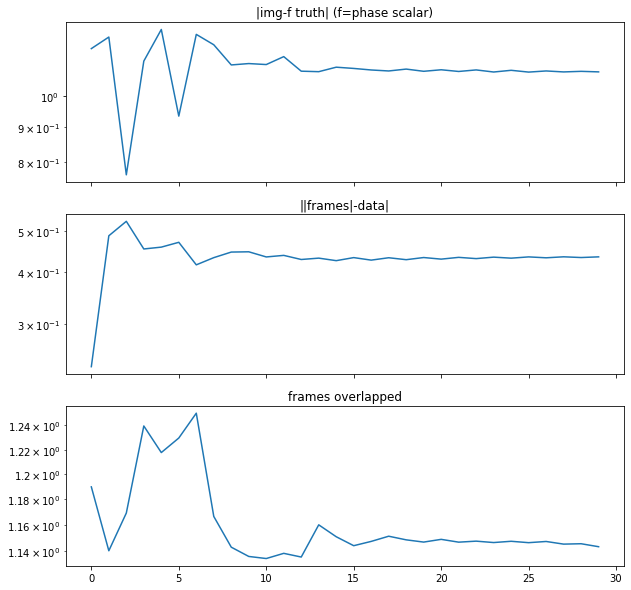

solver tot (seconds) : 3.845873820129782 loop: 3.7086013690568507 seconds
proxD : 11.488307403896833 %
Overlap : 0.28796191569410373 %
illuminate and split : 0.0809557612451606 %
mse: 0.8044968972014591 %
proxD (propagate(ffts), mse, prox)%: (97.74353764821602, 1.467836115502228, 0.771690655126262)


In [1]:
%run ptycho_reconstruct.py

In [2]:
import cupy as cp
cupy_array = cp.array([[[1, 2], [3, 4]], [[5, 6], [7, 8]]])

print(cupy_array)
# Print the CuPy ndarray directly
print(cupy_array.transpose(0,2,1).ravel(order='C'))
print(cupy_array.ravel(order='C'))

[[[1 2]
  [3 4]]

 [[5 6]
  [7 8]]]
[1 3 2 4 5 7 6 8]
[1 2 3 4 5 6 7 8]


In [10]:
print(translations_y)

[[[ 0]]

 [[ 0]]

 [[ 0]]

 [[ 0]]

 [[ 0]]

 [[ 0]]

 [[ 0]]

 [[ 0]]

 [[ 5]]

 [[ 5]]

 [[ 5]]

 [[ 5]]

 [[ 5]]

 [[ 5]]

 [[ 5]]

 [[ 5]]

 [[10]]

 [[10]]

 [[10]]

 [[10]]

 [[10]]

 [[10]]

 [[10]]

 [[10]]

 [[15]]

 [[15]]

 [[15]]

 [[15]]

 [[15]]

 [[15]]

 [[15]]

 [[15]]

 [[20]]

 [[20]]

 [[20]]

 [[20]]

 [[20]]

 [[20]]

 [[20]]

 [[20]]

 [[25]]

 [[25]]

 [[25]]

 [[25]]

 [[25]]

 [[25]]

 [[25]]

 [[25]]

 [[30]]

 [[30]]

 [[30]]

 [[30]]

 [[30]]

 [[30]]

 [[30]]

 [[30]]

 [[35]]

 [[35]]

 [[35]]

 [[35]]

 [[35]]

 [[35]]

 [[35]]

 [[35]]]


using GPU
loaded data, memory used, and total: 80896 82432
normalized by data.nbytes memory used and total normalized: 1.234375 1.2578125
data size 65536
----
Split and Overlap, memory used, and total: 283136 1464320
normalized by data.nbytes memory used and total normalized: 4.3203125 22.34375
data size 65536
----
geometry: img size: (37, 37) frames: (16, 16, 64)
not refining illumination, starting with good one, maxiter: 30
start AP memory used, and total: 358400 1464320
normalized by data.nbytes memory used and total normalized: 5.46875 22.34375
data size 65536
----
after Prox_data, memory used, and total: 359424 1464320
normalized by data.nbytes memory used and total normalized: 5.484375 22.34375
----
after frames initial, memory used, and total: 490496 1464320
normalized by data.nbytes memory used and total normalized: 7.484375 22.34375
----
!!!frames_norm (7.402797+0j) (7.402797+0j)
start loop, memory used, and total: 563200 1464320
normalized by data.nbytes memory used and total

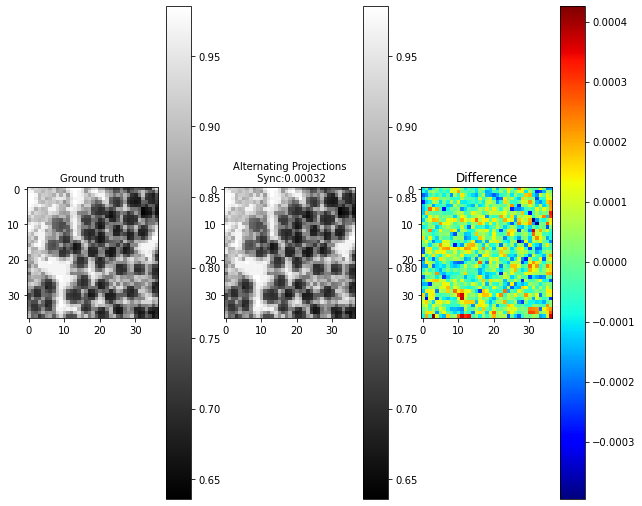

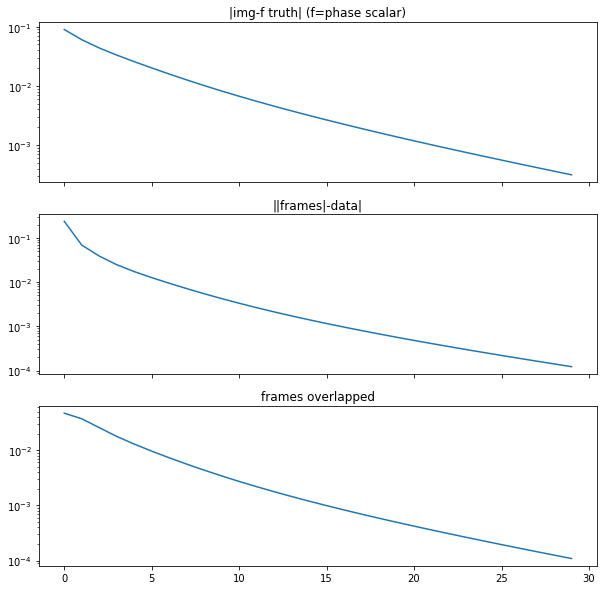

solver tot (seconds) : 1.3883425639942288 loop: 1.2408539841417223 seconds
proxD : 37.39817443622231 %
Overlap : 0.6624829862276528 %
illuminate and split : 0.22844244527745156 %
mse: 2.1021598211764774 %
proxD (propagate(ffts), mse, prox)%: (97.80416360988268, 1.3844210518946065, 0.7968205620602307)


In [1]:
%run ptycho_reconstruct.py

In [2]:
import cupyx.scipy.sparse as sparse

changed _eigen.py

In [5]:
import cupyx
import cupyx.scipy.sparse.linalg
print(cupyx.scipy.sparse.linalg.__file__)

/cds/home/y/yn754/anaconda3/envs/sharpy-env/py311/lib/python3.11/site-packages/cupyx/scipy/sparse/linalg/__init__.py


In [6]:
import cupyx.scipy
cupyx.scipy.sparse.linalg.__file__

'/cds/home/y/yn754/anaconda3/envs/sharpy-env/py311/lib/python3.11/site-packages/cupyx/scipy/sparse/linalg/__init__.py'

In [ ]:
from cupyx.scipy.sparse.linalg._eigen import eigsh

In [1]:
# %load /cds/home/y/yn754/anaconda3/envs/sharpy-env/py311/lib/python3.11/site-packages/cupyx/scipy/sparse/linalg/_eigen.py
import numpy
import cupy

from cupy import cublas
from cupyx import cusparse
from cupy._core import _dtype
from cupy.cuda import device
from cupy_backends.cuda.libs import cublas as _cublas
from cupy_backends.cuda.libs import cusparse as _cusparse
from cupyx.scipy.sparse import _csr
from cupyx.scipy.sparse.linalg import _interface


#def eigsh(a, k=6, *, which='LM', ncv=None, maxiter=None, tol=0,
#          return_eigenvectors=True):
def eigsh(a, k=6, *, which='LM', v0=None, ncv=None, maxiter=None,
           tol=0, return_eigenvectors=True):


    """
    Find ``k`` eigenvalues and eigenvectors of the real symmetric square
    matrix or complex Hermitian matrix ``A``.

    Solves ``Ax = wx``, the standard eigenvalue problem for ``w`` eigenvalues
    with corresponding eigenvectors ``x``.

    Args:
        a (ndarray, spmatrix or LinearOperator): A symmetric square matrix with
            dimension ``(n, n)``. ``a`` must :class:`cupy.ndarray`,
            :class:`cupyx.scipy.sparse.spmatrix` or
            :class:`cupyx.scipy.sparse.linalg.LinearOperator`.
        k (int): The number of eigenvalues and eigenvectors to compute. Must be
            ``1 <= k < n``.
        which (str): 'LM' or 'LA'. 'LM': finds ``k`` largest (in magnitude)
            eigenvalues. 'LA': finds ``k`` largest (algebraic) eigenvalues.
            'SA': finds ``k`` smallest (algebraic) eigenvalues.

        ncv (int): The number of Lanczos vectors generated. Must be
            ``k + 1 < ncv < n``. If ``None``, default value is used.
        maxiter (int): Maximum number of Lanczos update iterations.
            If ``None``, default value is used.
        tol (float): Tolerance for residuals ``||Ax - wx||``. If ``0``, machine
            precision is used.
        return_eigenvectors (bool): If ``True``, returns eigenvectors in
            addition to eigenvalues.

    Returns:
        tuple:
            If ``return_eigenvectors is True``, it returns ``w`` and ``x``
            where ``w`` is eigenvalues and ``x`` is eigenvectors. Otherwise,
            it returns only ``w``.

    .. seealso:: :func:`scipy.sparse.linalg.eigsh`

    .. note::
        This function uses the thick-restart Lanczos methods
        (https://sdm.lbl.gov/~kewu/ps/trlan.html).

    """
    n = a.shape[0]
    if a.ndim != 2 or a.shape[0] != a.shape[1]:
        raise ValueError('expected square matrix (shape: {})'.format(a.shape))
    if a.dtype.char not in 'fdFD':
        raise TypeError('unsupprted dtype (actual: {})'.format(a.dtype))
    if k <= 0:
        raise ValueError('k must be greater than 0 (actual: {})'.format(k))
    if k >= n:
        raise ValueError('k must be smaller than n (actual: {})'.format(k))
    if which not in ('LM', 'LA', 'SA'):
        raise ValueError('which must be \'LM\',\'LA\'or\'SA\' (actual: {})'
                         ''.format(which))
    if ncv is None:
        ncv = min(max(2 * k, k + 32), n - 1)
    else:
        ncv = min(max(ncv, k + 2), n - 1)
    if maxiter is None:
        maxiter = 10 * n
    if tol == 0:
        tol = numpy.finfo(a.dtype).eps

    alpha = cupy.zeros((ncv,), dtype=a.dtype)
    beta = cupy.zeros((ncv,), dtype=a.dtype.char.lower())
    V = cupy.empty((ncv, n), dtype=a.dtype)

    # Set initial vector
    #u = cupy.random.random((n,)).astype(a.dtype)
    #V[0] = u / cublas.nrm2(u)
    if v0 is None:
        u = cupy.random.random((n,)).astype(a.dtype)
        V[0] = u / cublas.nrm2(u)
    else:
        u = v0
        V[0] = v0 / cublas.nrm2(v0)	
    
    # Choose Lanczos implementation, unconditionally use 'fast' for now
    upadte_impl = 'fast'
    if upadte_impl == 'fast':
        lanczos = _lanczos_fast(a, n, ncv)
    else:
        lanczos = _lanczos_asis

    # Lanczos iteration
    lanczos(a, V, u, alpha, beta, 0, ncv)

    iter = ncv
    w, s = _eigsh_solve_ritz(alpha, beta, None, k, which)
    x = V.T @ s

    # Compute residual
    beta_k = beta[-1] * s[-1, :]
    res = cublas.nrm2(beta_k)

    uu = cupy.empty((k,), dtype=a.dtype)

    while res > tol and iter < maxiter:
        # Setup for thick-restart
        beta[:k] = 0
        alpha[:k] = w
        V[:k] = x.T

        # u -= u.T @ V[:k].conj().T @ V[:k]
        cublas.gemv(_cublas.CUBLAS_OP_C, 1, V[:k].T, u, 0, uu)
        cublas.gemv(_cublas.CUBLAS_OP_N, -1, V[:k].T, uu, 1, u)
        V[k] = u / cublas.nrm2(u)

        u[...] = a @ V[k]
        cublas.dotc(V[k], u, out=alpha[k])
        u -= alpha[k] * V[k]
        u -= V[:k].T @ beta_k
        cublas.nrm2(u, out=beta[k])
        V[k+1] = u / beta[k]

        # Lanczos iteration
        lanczos(a, V, u, alpha, beta, k + 1, ncv)

        iter += ncv - k
        w, s = _eigsh_solve_ritz(alpha, beta, beta_k, k, which)
        x = V.T @ s

        # Compute residual
        beta_k = beta[-1] * s[-1, :]
        res = cublas.nrm2(beta_k)

    if return_eigenvectors:
        idx = cupy.argsort(w)
        return w[idx], x[:, idx]
    else:
        return cupy.sort(w)


def _lanczos_asis(a, V, u, alpha, beta, i_start, i_end):
    for i in range(i_start, i_end):
        u[...] = a @ V[i]
        cublas.dotc(V[i], u, out=alpha[i])
        u -= u.T @ V[:i+1].conj().T @ V[:i+1]
        cublas.nrm2(u, out=beta[i])
        if i >= i_end - 1:
            break
        V[i+1] = u / beta[i]


def _lanczos_fast(A, n, ncv):
    cublas_handle = device.get_cublas_handle()
    cublas_pointer_mode = _cublas.getPointerMode(cublas_handle)
    if A.dtype.char == 'f':
        dotc = _cublas.sdot
        nrm2 = _cublas.snrm2
        gemv = _cublas.sgemv
        axpy = _cublas.saxpy
    elif A.dtype.char == 'd':
        dotc = _cublas.ddot
        nrm2 = _cublas.dnrm2
        gemv = _cublas.dgemv
        axpy = _cublas.daxpy
    elif A.dtype.char == 'F':
        dotc = _cublas.cdotc
        nrm2 = _cublas.scnrm2
        gemv = _cublas.cgemv
        axpy = _cublas.caxpy
    elif A.dtype.char == 'D':
        dotc = _cublas.zdotc
        nrm2 = _cublas.dznrm2
        gemv = _cublas.zgemv
        axpy = _cublas.zaxpy
    else:
        raise TypeError('invalid dtype ({})'.format(A.dtype))

    cusparse_handle = None
    if _csr.isspmatrix_csr(A) and cusparse.check_availability('spmv'):
        cusparse_handle = device.get_cusparse_handle()
        spmv_op_a = _cusparse.CUSPARSE_OPERATION_NON_TRANSPOSE
        spmv_alpha = numpy.array(1.0, A.dtype)
        spmv_beta = numpy.array(0.0, A.dtype)
        spmv_cuda_dtype = _dtype.to_cuda_dtype(A.dtype)
        spmv_alg = _cusparse.CUSPARSE_MV_ALG_DEFAULT

    v = cupy.empty((n,), dtype=A.dtype)
    uu = cupy.empty((ncv,), dtype=A.dtype)
    vv = cupy.empty((n,), dtype=A.dtype)
    b = cupy.empty((), dtype=A.dtype)
    one = numpy.array(1.0, dtype=A.dtype)
    zero = numpy.array(0.0, dtype=A.dtype)
    mone = numpy.array(-1.0, dtype=A.dtype)

    outer_A = A

    def aux(A, V, u, alpha, beta, i_start, i_end):
        assert A is outer_A

        # Get ready for spmv if enabled
        if cusparse_handle is not None:
            # Note: I would like to reuse descriptors and working buffer
            # on the next update, but I gave it up because it sometimes
            # caused illegal memory access error.
            spmv_desc_A = cusparse.SpMatDescriptor.create(A)
            spmv_desc_v = cusparse.DnVecDescriptor.create(v)
            spmv_desc_u = cusparse.DnVecDescriptor.create(u)
            buff_size = _cusparse.spMV_bufferSize(
                cusparse_handle, spmv_op_a, spmv_alpha.ctypes.data,
                spmv_desc_A.desc, spmv_desc_v.desc, spmv_beta.ctypes.data,
                spmv_desc_u.desc, spmv_cuda_dtype, spmv_alg)
            spmv_buff = cupy.empty(buff_size, cupy.int8)

        v[...] = V[i_start]
        for i in range(i_start, i_end):
            # Matrix-vector multiplication
            if cusparse_handle is None:
                u[...] = A @ v
            else:
                _cusparse.spMV(
                    cusparse_handle, spmv_op_a, spmv_alpha.ctypes.data,
                    spmv_desc_A.desc, spmv_desc_v.desc,
                    spmv_beta.ctypes.data, spmv_desc_u.desc,
                    spmv_cuda_dtype, spmv_alg, spmv_buff.data.ptr)

            # Call dotc: alpha[i] = v.conj().T @ u
            _cublas.setPointerMode(
                cublas_handle, _cublas.CUBLAS_POINTER_MODE_DEVICE)
            try:
                dotc(cublas_handle, n, v.data.ptr, 1, u.data.ptr, 1,
                     alpha.data.ptr + i * alpha.itemsize)
            finally:
                _cublas.setPointerMode(cublas_handle, cublas_pointer_mode)

            # Orthogonalize: u = u - alpha[i] * v - beta[i - 1] * V[i - 1]
            vv.fill(0)
            b[...] = beta[i - 1]    # cast from real to complex
            _cublas.setPointerMode(
                cublas_handle, _cublas.CUBLAS_POINTER_MODE_DEVICE)
            try:
                axpy(cublas_handle, n,
                     alpha.data.ptr + i * alpha.itemsize,
                     v.data.ptr, 1, vv.data.ptr, 1)
                axpy(cublas_handle, n,
                     b.data.ptr,
                     V[i - 1].data.ptr, 1, vv.data.ptr, 1)
            finally:
                _cublas.setPointerMode(cublas_handle, cublas_pointer_mode)
            axpy(cublas_handle, n,
                 mone.ctypes.data,
                 vv.data.ptr, 1, u.data.ptr, 1)

            # Reorthogonalize: u -= V @ (V.conj().T @ u)
            gemv(cublas_handle, _cublas.CUBLAS_OP_C,
                 n, i + 1,
                 one.ctypes.data, V.data.ptr, n,
                 u.data.ptr, 1,
                 zero.ctypes.data, uu.data.ptr, 1)
            gemv(cublas_handle, _cublas.CUBLAS_OP_N,
                 n, i + 1,
                 mone.ctypes.data, V.data.ptr, n,
                 uu.data.ptr, 1,
                 one.ctypes.data, u.data.ptr, 1)
            alpha[i] += uu[i]

            # Call nrm2
            _cublas.setPointerMode(
                cublas_handle, _cublas.CUBLAS_POINTER_MODE_DEVICE)
            try:
                nrm2(cublas_handle, n, u.data.ptr, 1,
                     beta.data.ptr + i * beta.itemsize)
            finally:
                _cublas.setPointerMode(cublas_handle, cublas_pointer_mode)

            # Break here as the normalization below touches V[i+1]
            if i >= i_end - 1:
                break

            # Normalize
            _kernel_normalize(u, beta, i, n, v, V)

    return aux


_kernel_normalize = cupy.ElementwiseKernel(
    'T u, raw S beta, int32 j, int32 n', 'T v, raw T V',
    'v = u / beta[j]; V[i + (j+1) * n] = v;', 'cupy_eigsh_normalize'
)


def _eigsh_solve_ritz(alpha, beta, beta_k, k, which):
    # Note: This is done on the CPU, because there is an issue in
    # cupy.linalg.eigh with CUDA 9.2, which can return NaNs. It will has little
    # impact on performance, since the matrix size processed here is not large.
    alpha = cupy.asnumpy(alpha)
    beta = cupy.asnumpy(beta)
    t = numpy.diag(alpha)
    t = t + numpy.diag(beta[:-1], k=1)
    t = t + numpy.diag(beta[:-1], k=-1)
    if beta_k is not None:
        beta_k = cupy.asnumpy(beta_k)
        t[k, :k] = beta_k
        t[:k, k] = beta_k
    w, s = numpy.linalg.eigh(t)

    # Pick-up k ritz-values and ritz-vectors
    if which == 'LA':
        idx = numpy.argsort(w)
        wk = w[idx[-k:]]
        sk = s[:, idx[-k:]]
    elif which == 'LM':
        idx = numpy.argsort(numpy.absolute(w))
        wk = w[idx[-k:]]
        sk = s[:, idx[-k:]]

    elif which == 'SA':
        idx = numpy.argsort(w)
        wk = w[idx[:k]]
        sk = s[:, idx[:k]]
    # elif which == 'SM':  #dysfunctional
    #   idx = cupy.argsort(abs(w))
    #   wk = w[idx[:k]]
    #   sk = s[:,idx[:k]]
    return cupy.array(wk), cupy.array(sk)


def svds(a, k=6, *, ncv=None, tol=0, which='LM', maxiter=None,
         return_singular_vectors=True):
    """Finds the largest ``k`` singular values/vectors for a sparse matrix.

    Args:
        a (ndarray, spmatrix or LinearOperator): A real or complex array with
            dimension ``(m, n)``. ``a`` must :class:`cupy.ndarray`,
            :class:`cupyx.scipy.sparse.spmatrix` or
            :class:`cupyx.scipy.sparse.linalg.LinearOperator`.
        k (int): The number of singular values/vectors to compute. Must be
            ``1 <= k < min(m, n)``.
        ncv (int): The number of Lanczos vectors generated. Must be
            ``k + 1 < ncv < min(m, n)``. If ``None``, default value is used.
        tol (float): Tolerance for singular values. If ``0``, machine precision
            is used.
        which (str): Only 'LM' is supported. 'LM': finds ``k`` largest singular
            values.
        maxiter (int): Maximum number of Lanczos update iterations.
            If ``None``, default value is used.
        return_singular_vectors (bool): If ``True``, returns singular vectors
            in addition to singular values.

    Returns:
        tuple:
            If ``return_singular_vectors`` is ``True``, it returns ``u``, ``s``
            and ``vt`` where ``u`` is left singular vectors, ``s`` is singular
            values and ``vt`` is right singular vectors. Otherwise, it returns
            only ``s``.

    .. seealso:: :func:`scipy.sparse.linalg.svds`

    .. note::
        This is a naive implementation using cupyx.scipy.sparse.linalg.eigsh as
        an eigensolver on ``a.H @ a`` or ``a @ a.H``.

    """
    if a.ndim != 2:
        raise ValueError('expected 2D (shape: {})'.format(a.shape))
    if a.dtype.char not in 'fdFD':
        raise TypeError('unsupprted dtype (actual: {})'.format(a.dtype))
    m, n = a.shape
    if k <= 0:
        raise ValueError('k must be greater than 0 (actual: {})'.format(k))
    if k >= min(m, n):
        raise ValueError('k must be smaller than min(m, n) (actual: {})'
                         ''.format(k))

    a = _interface.aslinearoperator(a)
    if m >= n:
        aH, a = a.H, a
    else:
        aH, a = a, a.H

    if return_singular_vectors:
        w, x = eigsh(aH @ a, k=k, which=which, ncv=ncv, maxiter=maxiter,
                     tol=tol, return_eigenvectors=True)
    else:
        w = eigsh(aH @ a, k=k, which=which, ncv=ncv, maxiter=maxiter, tol=tol,
                  return_eigenvectors=False)

    w = cupy.maximum(w, 0)
    t = w.dtype.char.lower()
    factor = {'f': 1e3, 'd': 1e6}
    cond = factor[t] * numpy.finfo(t).eps
    cutoff = cond * cupy.max(w)
    above_cutoff = (w > cutoff)
    n_large = above_cutoff.sum().item()
    s = cupy.zeros_like(w)
    s[:n_large] = cupy.sqrt(w[above_cutoff])
    if not return_singular_vectors:
        return s

    x = x[:, above_cutoff]
    if m >= n:
        v = x
        u = a @ v / s[:n_large]
    else:
        u = x
        v = a @ u / s[:n_large]
    u = _augmented_orthnormal_cols(u, k - n_large)
    v = _augmented_orthnormal_cols(v, k - n_large)

    return u, s, v.conj().T


def _augmented_orthnormal_cols(x, n_aug):
    if n_aug <= 0:
        return x
    m, n = x.shape
    y = cupy.empty((m, n + n_aug), dtype=x.dtype)
    y[:, :n] = x
    for i in range(n, n + n_aug):
        v = cupy.random.random((m, )).astype(x.dtype)
        v -= v @ y[:, :i].conj() @ y[:, :i].T
        y[:, i] = v / cupy.linalg.norm(v)
    return y


In [3]:
# %load /cds/home/y/yn754/anaconda3/envs/sharpy-env/py311/lib/python3.11/site-packages/cupyx/scipy/sparse/linalg/__init__.py
# Functions from the following SciPy document
# https://docs.scipy.org/doc/scipy/reference/sparse.linalg.html

# "NOQA" to suppress flake8 warning
from cupyx.scipy.sparse.linalg._norm import norm  # NOQA
from cupyx.scipy.sparse.linalg._solve import spsolve  # NOQA
from cupyx.scipy.sparse.linalg._solve import spsolve_triangular  # NOQA
from cupyx.scipy.sparse.linalg._solve import factorized  # NOQA
from cupyx.scipy.sparse.linalg._solve import lsqr  # NOQA
from cupyx.scipy.sparse.linalg._solve import lsmr  # NOQA
from cupyx.scipy.sparse.linalg._solve import splu  # NOQA
from cupyx.scipy.sparse.linalg._solve import spilu  # NOQA
from cupyx.scipy.sparse.linalg._solve import SuperLU  # NOQA
from cupyx.scipy.sparse.linalg._solve import minres  # NOQA
from cupyx.scipy.sparse.linalg._eigen import eigsh  # NOQA
from cupyx.scipy.sparse.linalg._eigen import svds  # NOQA
from cupyx.scipy.sparse.linalg._iterative import cg  # NOQA
from cupyx.scipy.sparse.linalg._iterative import gmres  # NOQA
from cupyx.scipy.sparse.linalg._iterative import cgs  # NOQA
from cupyx.scipy.sparse.linalg._interface import LinearOperator  # NOQA
from cupyx.scipy.sparse.linalg._interface import aslinearoperator  # NOQA
from cupyx.scipy.sparse.linalg._lobpcg import lobpcg  # NOQA


In [4]:
from cupyx.scipy.sparse.linalg import eigsh

In [ ]:
import tests/cupyx_tests/scipy_tests/sparse_tests/test_linalg.py